<a href="https://colab.research.google.com/github/toraaglobal/CaseStudies/blob/master/TimeForRetailProphet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Another alternative for building time series models at scale.  Based on the research from facebook - [Prophet](https://research.fb.com/prophet-forecasting-at-scale/) - allows the user to quickly produce high quality forecasts with the ability to adjust multiple parameters.
Initial code modeled after Digital Ocean's [tutorial](https://www.digitalocean.com/community/tutorials/a-guide-to-time-series-forecasting-with-prophet-in-python-3).



In [0]:
# If error with import Prophet try
# !pip install fbprophet

In [0]:
%matplotlib inline
import pandas as pd
from fbprophet import Prophet

import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

In [3]:
# OBTAIN

df = pd.read_csv('https://raw.githubusercontent.com/2SUBDA/Breakouts/Week4/OnCampusWeeklyData.csv')
df.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2/5/2010,24924.50,False
1,1,1,2/12/2010,46039.49,True
2,1,1,2/19/2010,41595.55,False
3,1,1,2/26/2010,19403.54,False
4,1,1,3/5/2010,21827.90,False


In [4]:
## convert the data column to datatime using pandas to_datatime

df['Date'] = pd.to_datetime(df['Date'])

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
Store           421570 non-null int64
Dept            421570 non-null int64
Date            421570 non-null datetime64[ns]
Weekly_Sales    421570 non-null float64
IsHoliday       421570 non-null bool
dtypes: bool(1), datetime64[ns](1), float64(1), int64(2)
memory usage: 13.3 MB


In [5]:
df.shape

(421570, 5)

In [6]:
df.isnull().sum()

Store           0
Dept            0
Date            0
Weekly_Sales    0
IsHoliday       0
dtype: int64

In [7]:
# SCRUB
# Rename zip code column for clarity

df = df.rename(index=str, columns={"Date": "ds", 'Weekly_Sales':'y'})
df.head()

,Store,Dept,ds,y,IsHoliday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False


In [8]:
df.Dept.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18,
       19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 40, 41, 42, 44, 45, 46, 47, 48, 49, 51, 52, 54, 55, 56,
       58, 59, 60, 67, 71, 72, 74, 77, 78, 79, 80, 81, 82, 83, 85, 87, 90,
       91, 92, 93, 94, 95, 96, 97, 98, 99, 39, 50, 43, 65])

In [9]:
## take a subset of Dept 9
df9 = df[df['Dept'] == 9]

df9.head()

,Store,Dept,ds,y,IsHoliday
1144,1,9,2010-02-05,16930.99,False
1145,1,9,2010-02-12,16562.49,True
1146,1,9,2010-02-19,15880.85,False
1147,1,9,2010-02-26,15175.52,False
1148,1,9,2010-03-05,24064.70,False


Prophet limits the naming convention of the input columns to be ds (date) and y (the value) - following code renames columns in the Data Frame - and makes data table [dfs] for each department with given format.

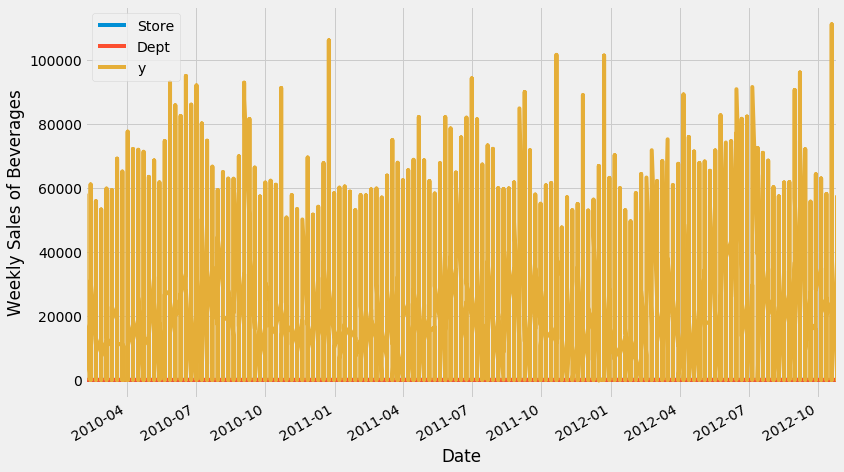

In [11]:
ax = df9.set_index('ds').plot(figsize=(12, 8))
ax.set_ylabel('Weekly Sales of Beverages')
ax.set_xlabel('Date')

plt.show()

In [12]:
# MODEL
# Set the uncertainty interval to 95% (the Prophet default is 80%)

bev_model = Prophet(interval_width=0.95)
bev_model.fit(df9)

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [13]:
future_dates = bev_model.make_future_dataframe(periods=13, freq='W')
future_dates.tail()

,ds
6362,2012-12-23
6363,2012-12-30
6364,2013-01-06
6365,2013-01-13
6366,2013-01-20


In [14]:
# MODEL

forecast = bev_model.predict(future_dates)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
6362,2012-12-23,23904.278373,-7234.349064,56276.334906
6363,2012-12-30,21274.883970,-10155.649966,52443.955608
6364,2013-01-06,15750.798177,-14994.680975,44347.058305
6365,2013-01-13,11042.744629,-21301.951641,42461.449320
6366,2013-01-20,10045.273217,-21801.223661,42166.763138


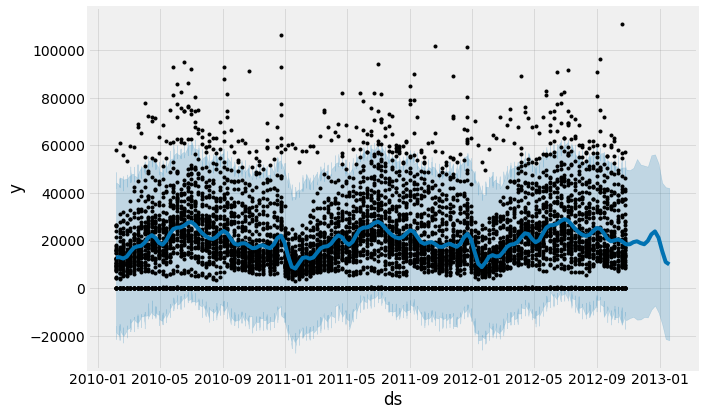

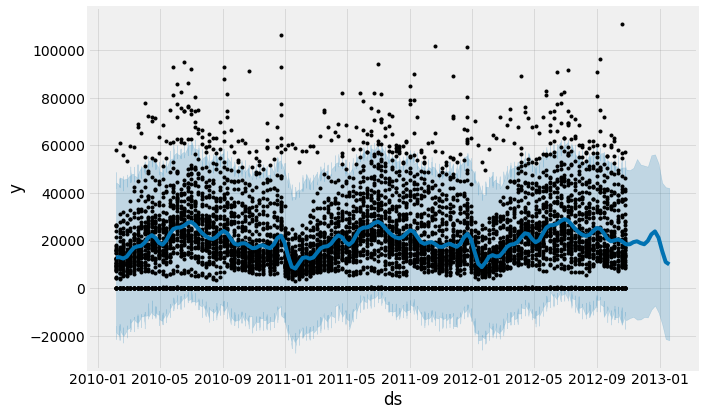

In [15]:
# MODEL

bev_model.plot(forecast, uncertainty=True)

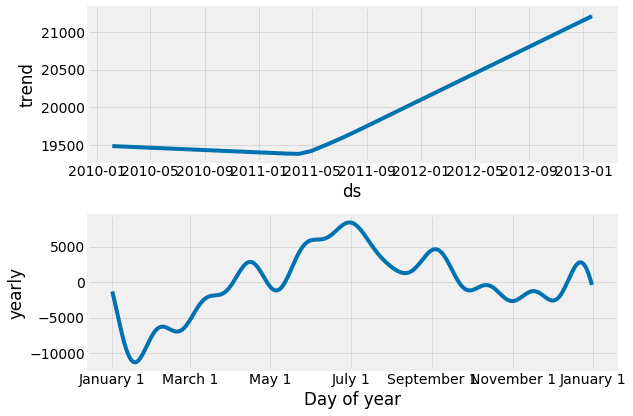

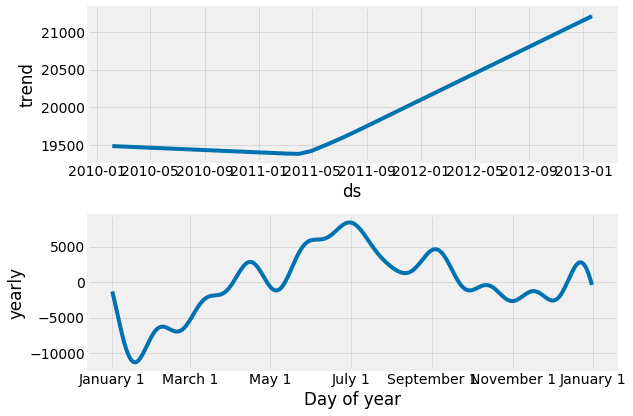

In [16]:
# INTERPRET

bev_model.plot_components(forecast)

In [0]:
## Model for all department

def run_prophet(df):
  model = Prophet(interval_width=0.95)
  model.fit(df)
  future_dates = model.make_future_dataframe(periods=13, freq='W')
  print(future_dates.tail())
  # MODEL
  forecast = model.predict(future_dates)
  print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail())
  print('Forcasting')
  model.plot(forecast, uncertainty=True)
  plt.show()
  print('Model Intepretation')
  model.plot_components(forecast)
  plt.show()
  
  
  
  

In [22]:
dept = list( df.Dept.unique())
print(dept)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 41, 42, 44, 45, 46, 47, 48, 49, 51, 52, 54, 55, 56, 58, 59, 60, 67, 71, 72, 74, 77, 78, 79, 80, 81, 82, 83, 85, 87, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 39, 50, 43, 65]


/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 1
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
6443 2012-12-23  36715.941434   9268.244804  62979.732093
6444 2012-12-30  25449.262281   -813.684031  51751.990375
6445 2013-01-06  14184.488365 -14109.051562  40489.692514
6446 2013-01-13   8784.162362 -17377.431380  33879.186278
6447 2013-01-20  10187.900113 -16029.868876  36263.608795
Forcasting


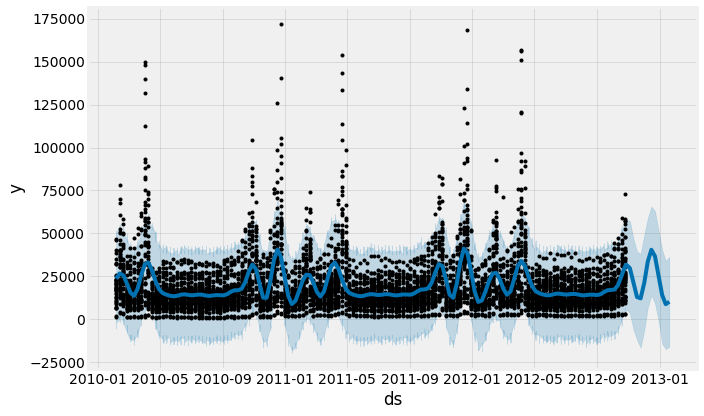

Model Intepretation


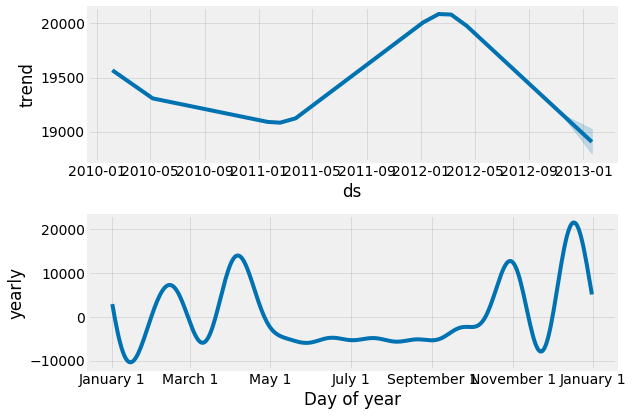

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 2
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
6443 2012-12-23  51791.616852    409.422930  96935.098547
6444 2012-12-30  47123.990529  -2360.041684  95996.713228
6445 2013-01-06  41448.376834  -8348.521060  91254.343478
6446 2013-01-13  38559.440443  -8971.539774  85580.007734
6447 2013-01-20  39403.469303 -12199.840056  89905.141889
Forcasting


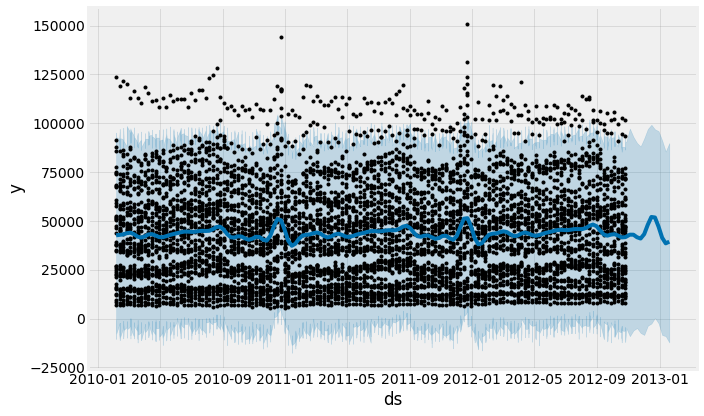

Model Intepretation


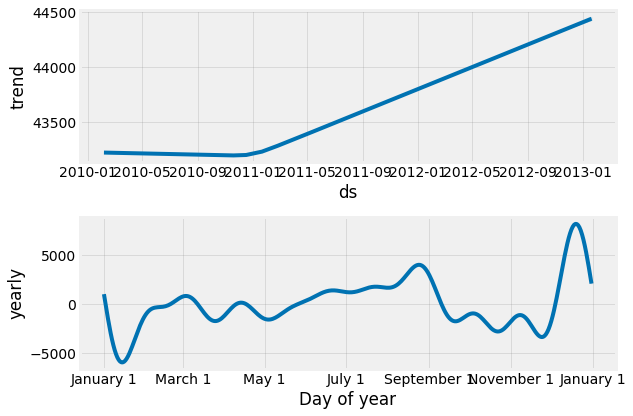

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 3
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6443 2012-12-23  13142.293903 -6911.156330  33306.620699
6444 2012-12-30  11548.235651 -7627.840850  31512.440719
6445 2013-01-06  10798.467650 -9866.968306  31280.563945
6446 2013-01-13  11399.718707 -7165.725625  31478.203666
6447 2013-01-20  12184.530662 -9942.368852  33449.364908
Forcasting


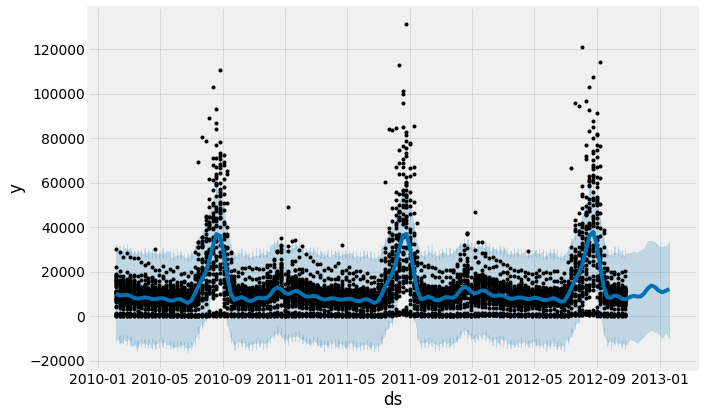

Model Intepretation


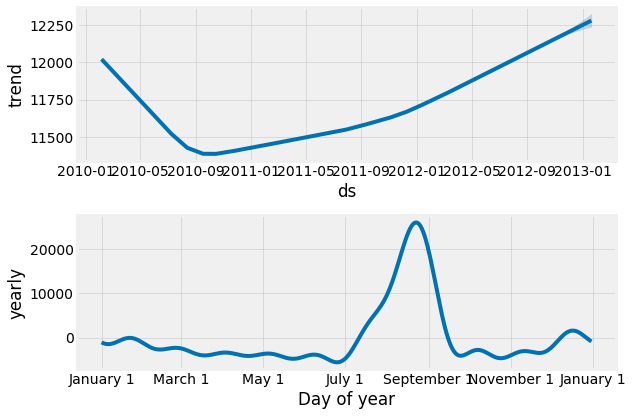

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 4
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6443 2012-12-23  28818.725854  1146.964159  54412.267648
6444 2012-12-30  28734.196315  2948.456077  55031.089204
6445 2013-01-06  27490.741057  1319.189074  53564.084495
6446 2013-01-13  25947.187713  1255.246966  52449.866570
6447 2013-01-20  25192.465115   337.003647  50440.051921
Forcasting


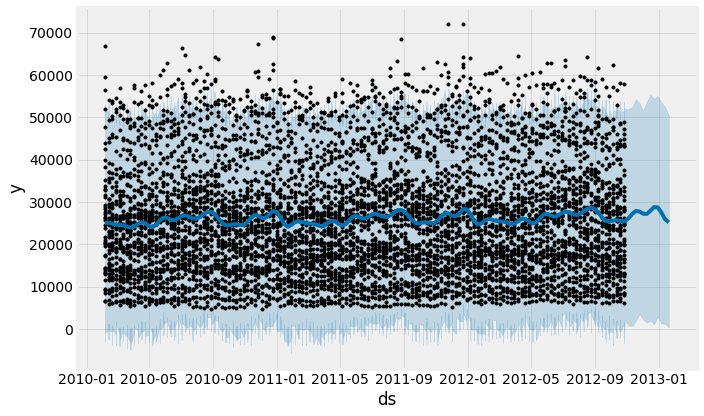

Model Intepretation


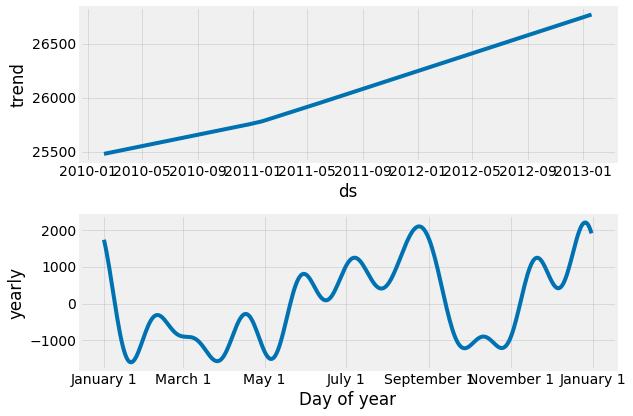

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 5
             ds
6355 2012-12-23
6356 2012-12-30
6357 2013-01-06
6358 2013-01-13
6359 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
6355 2012-12-23  54112.387947  17962.314766  87521.889371
6356 2012-12-30  42469.926681   6138.927516  77298.319229
6357 2013-01-06  25880.350946  -8478.408150  60780.894841
6358 2013-01-13  13574.686650 -20073.937868  49785.440974
6359 2013-01-20  11529.307107 -21381.308934  44712.111179
Forcasting


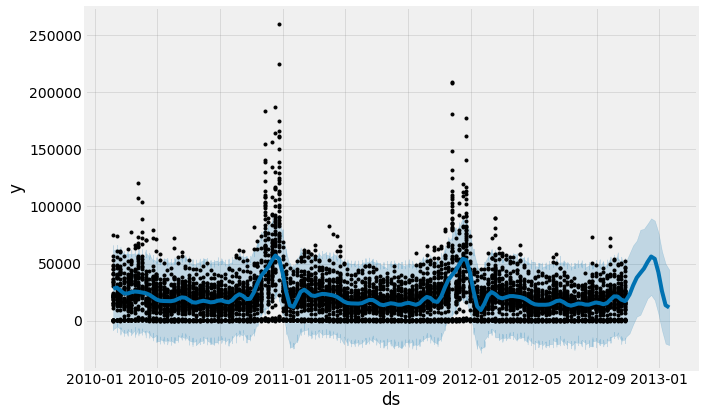

Model Intepretation


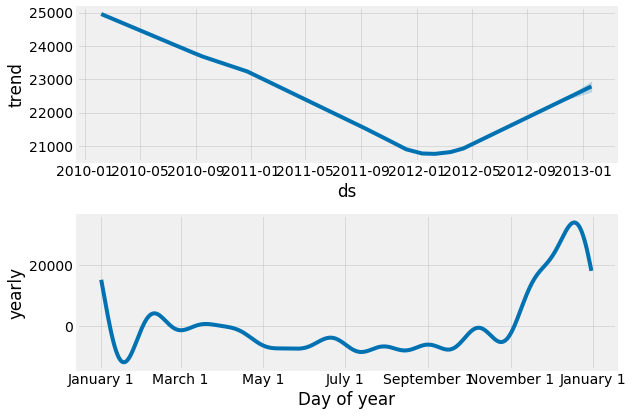

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 6
             ds
5994 2012-12-23
5995 2012-12-30
5996 2013-01-06
5997 2013-01-13
5998 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
5994 2012-12-23  10791.881995  3403.513094  18497.061579
5995 2012-12-30   8812.692334  1618.497402  16368.356430
5996 2013-01-06   4839.129000 -2870.656500  12156.345843
5997 2013-01-13   1234.426192 -6761.379006   8940.639388
5998 2013-01-20    160.647459 -6844.700012   8209.890159
Forcasting


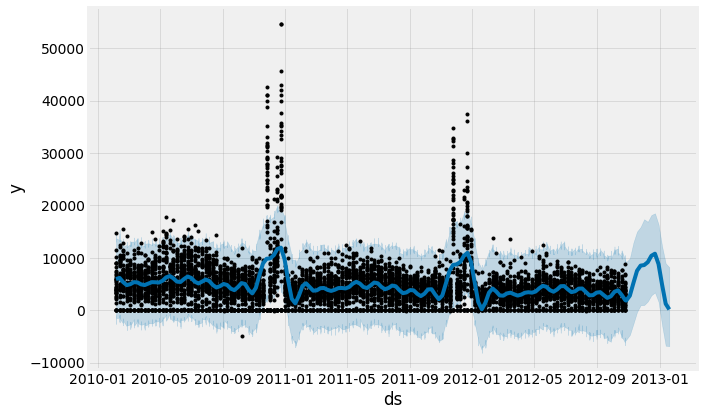

Model Intepretation


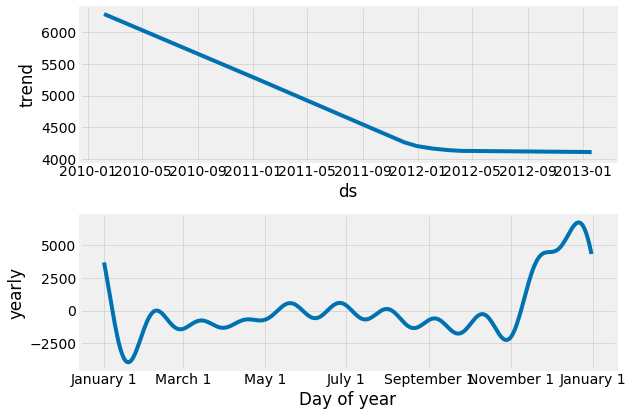

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 7
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower     yhat_upper
6443 2012-12-23  87122.446853  40501.614120  130025.678573
6444 2012-12-30  58477.993628  12460.412555  105600.510530
6445 2013-01-06  24499.305812 -21473.874604   71850.624600
6446 2013-01-13   4212.306212 -40530.248600   50763.272876
6447 2013-01-20   4082.369138 -43523.795367   43355.085815
Forcasting


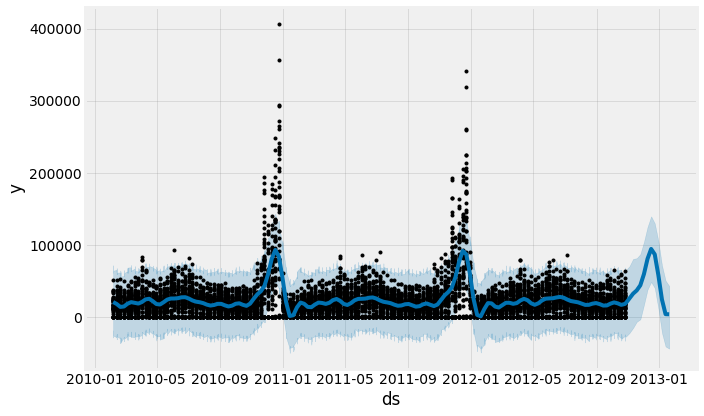

Model Intepretation


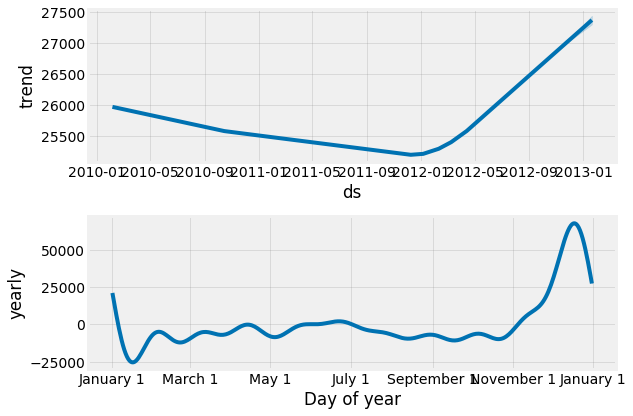

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 8
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6443 2012-12-23  35090.378216 -1663.468410  68690.326094
6444 2012-12-30  32433.006212 -2695.685822  67521.698678
6445 2013-01-06  29561.881998 -5564.240937  63668.651938
6446 2013-01-13  28499.838927 -4932.637990  67343.442039
6447 2013-01-20  29526.889528 -6325.045586  65944.850006
Forcasting


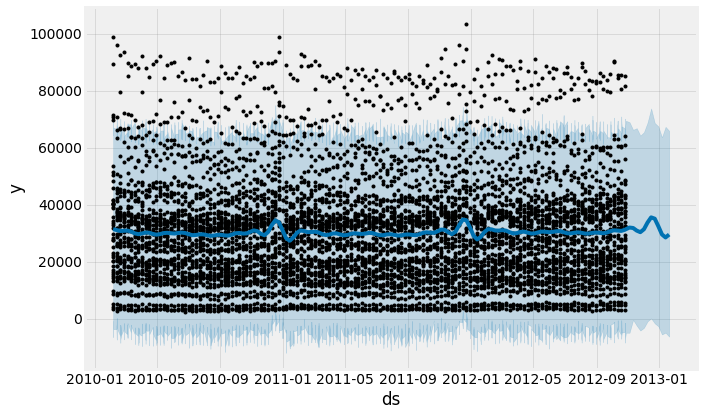

Model Intepretation


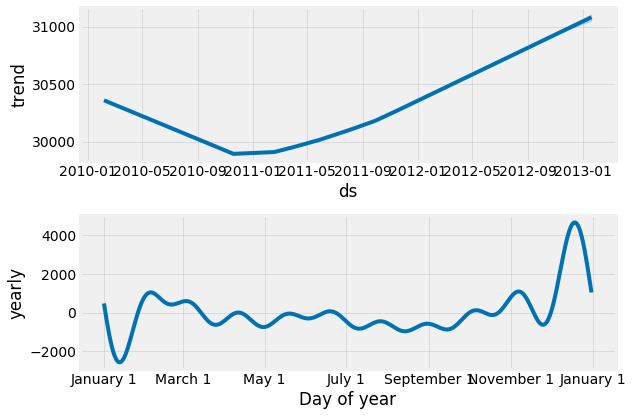

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 9
             ds
6362 2012-12-23
6363 2012-12-30
6364 2013-01-06
6365 2013-01-13
6366 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
6362 2012-12-23  23904.278373  -6392.184618  54524.959823
6363 2012-12-30  21274.883970 -10251.723598  51165.368259
6364 2013-01-06  15750.798177 -15514.447325  45955.117374
6365 2013-01-13  11042.744629 -19353.193761  44718.010400
6366 2013-01-20  10045.273217 -22969.824355  42045.186368
Forcasting


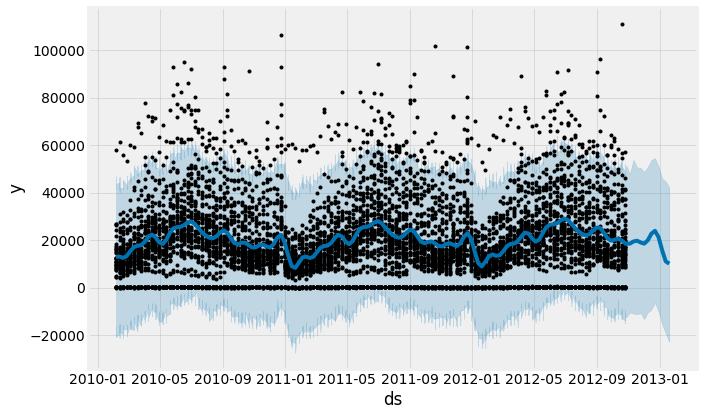

Model Intepretation


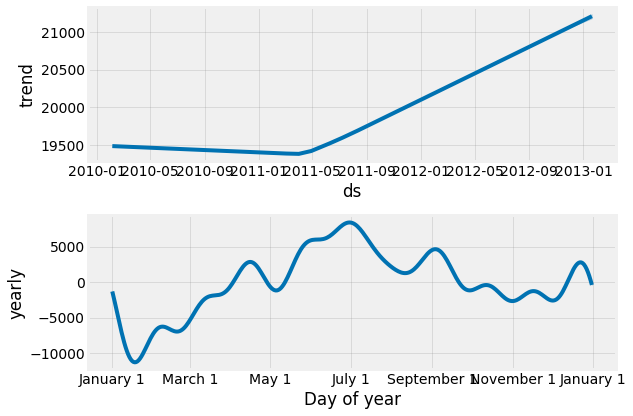

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 10
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
6443 2012-12-23  21036.990601  -2543.105845  45398.575679
6444 2012-12-30  19312.606477  -6661.031425  44539.593627
6445 2013-01-06  16955.093927  -8142.259078  42806.261665
6446 2013-01-13  15396.187721  -7967.699926  39626.634475
6447 2013-01-20  15425.845642 -10223.805598  38301.490189
Forcasting


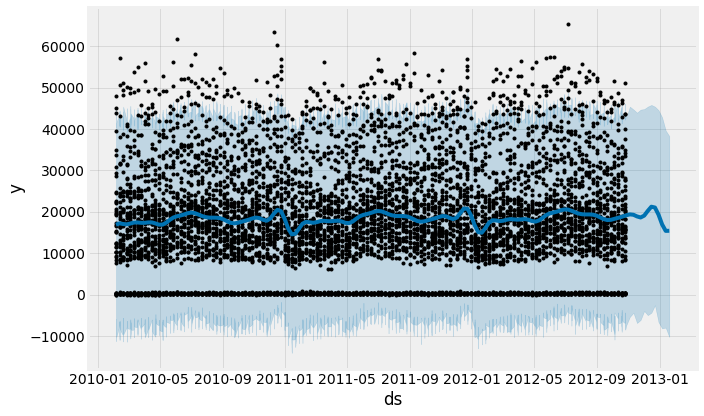

Model Intepretation


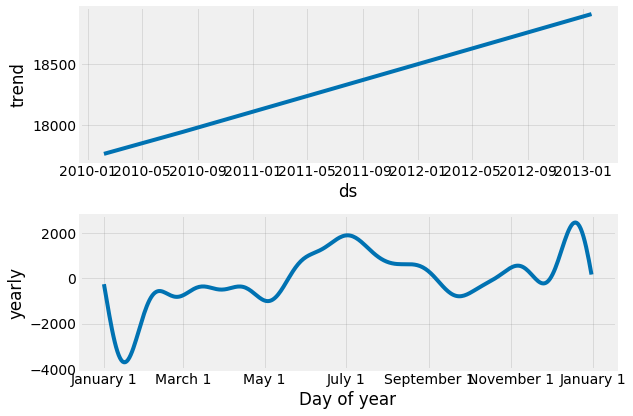

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 11
             ds
6442 2012-12-23
6443 2012-12-30
6444 2013-01-06
6445 2013-01-13
6446 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6442 2012-12-23  17068.445260 -2436.308194  36920.446142
6443 2012-12-30  15644.510291 -4597.423458  34391.191701
6444 2013-01-06  14338.183430 -3607.620727  33819.042271
6445 2013-01-13  13267.196575 -6856.893366  31788.233711
6446 2013-01-20  12710.423823 -5357.654291  33358.368073
Forcasting


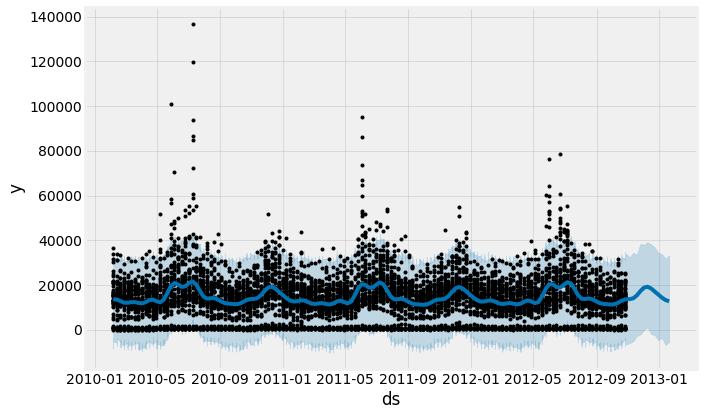

Model Intepretation


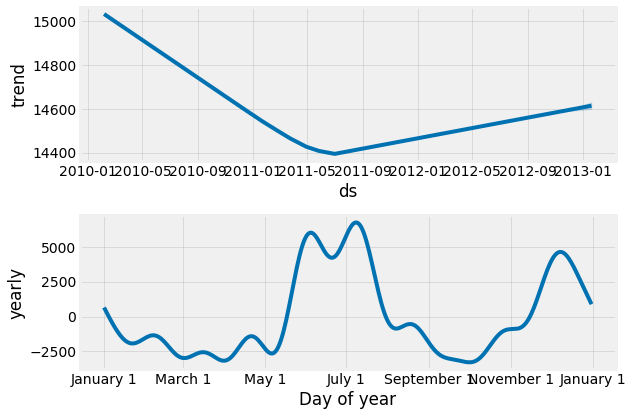

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 12
             ds
6417 2012-12-23
6418 2012-12-30
6419 2013-01-06
6420 2013-01-13
6421 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
6417 2012-12-23  2798.409689 -2443.628030  8199.006001
6418 2012-12-30  2760.495457 -2867.022510  8294.605311
6419 2013-01-06  2766.517282 -2656.060345  8138.408088
6420 2013-01-13  2826.138401 -2445.058145  8398.624374
6421 2013-01-20  2956.371880 -2631.538966  8545.408350
Forcasting


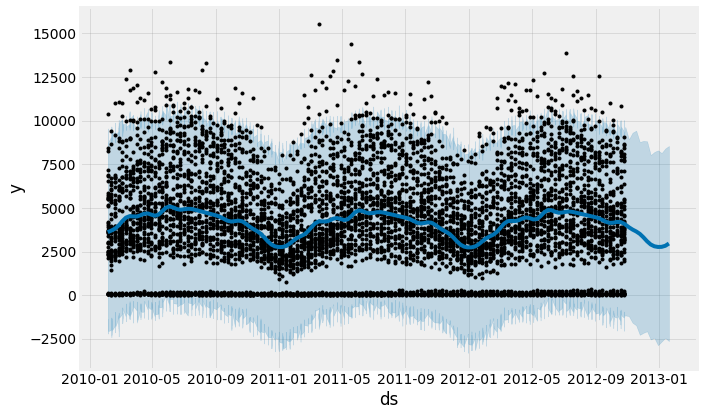

Model Intepretation


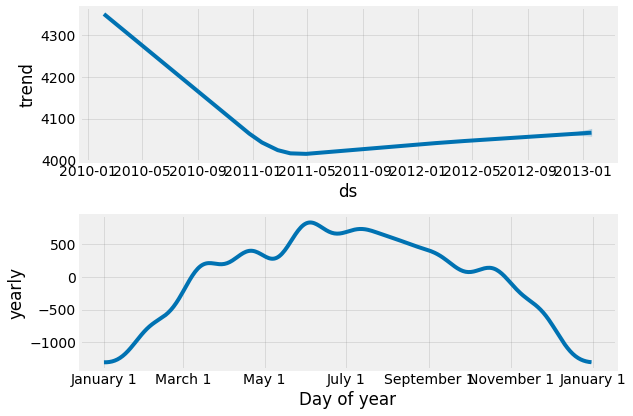

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 13
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6443 2012-12-23  28607.763786 -2514.032894  59967.756475
6444 2012-12-30  29000.853497 -1434.680229  60880.734074
6445 2013-01-06  29283.049975   -20.994355  59062.823258
6446 2013-01-13  29387.687530 -2037.925735  61078.461499
6447 2013-01-20  29370.702628  -904.473305  63232.230733
Forcasting


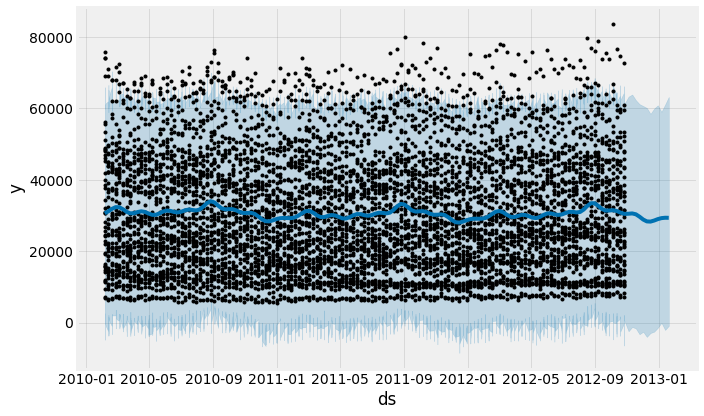

Model Intepretation


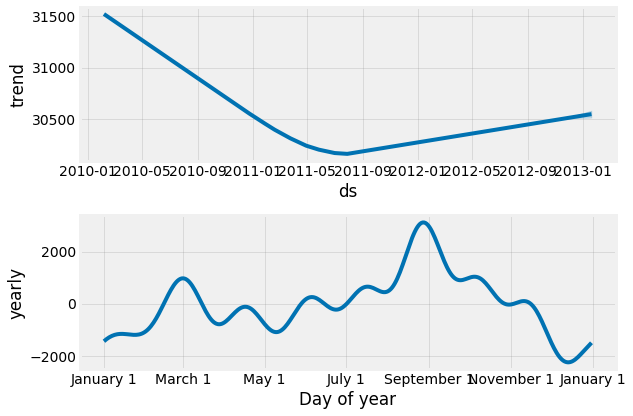

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 14
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
6443 2012-12-23  31326.409233  11377.522584  52594.166943
6444 2012-12-30  26189.288439   5433.106474  48327.905265
6445 2013-01-06  17797.905875  -4962.903753  40666.817111
6446 2013-01-13  11259.423381 -11170.962412  32194.912663
6447 2013-01-20  10003.584894  -9755.432354  30572.307544
Forcasting


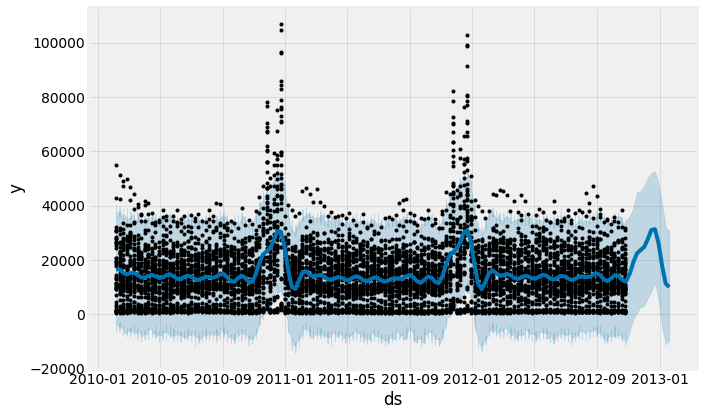

Model Intepretation


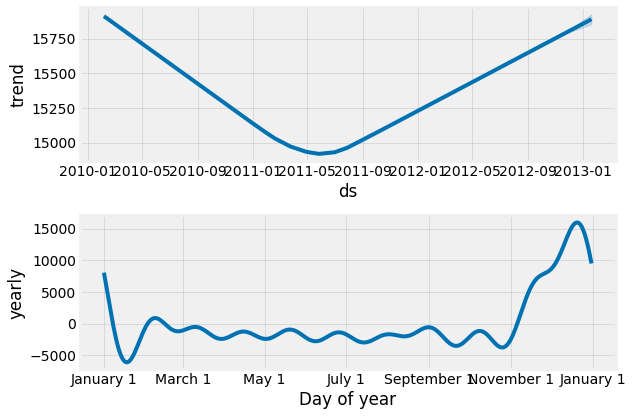

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 16
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds         yhat    yhat_lower    yhat_upper
6443 2012-12-23  2439.348754 -22896.113656  26805.171838
6444 2012-12-30  3066.268960 -21739.668987  27727.531717
6445 2013-01-06  3156.207408 -19684.620626  28537.379309
6446 2013-01-13  2781.476452 -21527.933871  29055.172534
6447 2013-01-20  2699.013867 -23141.062941  27239.939150
Forcasting


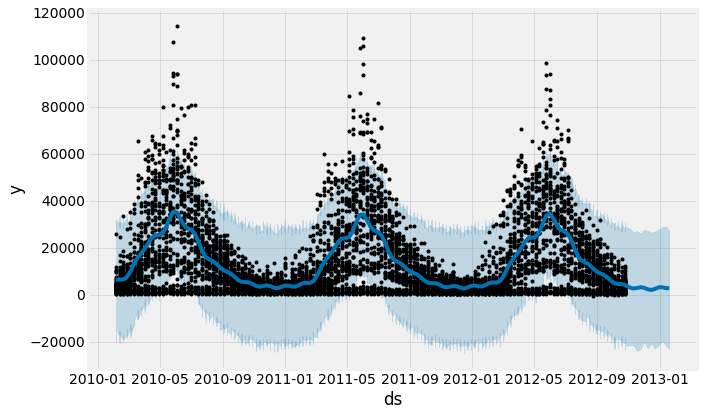

Model Intepretation


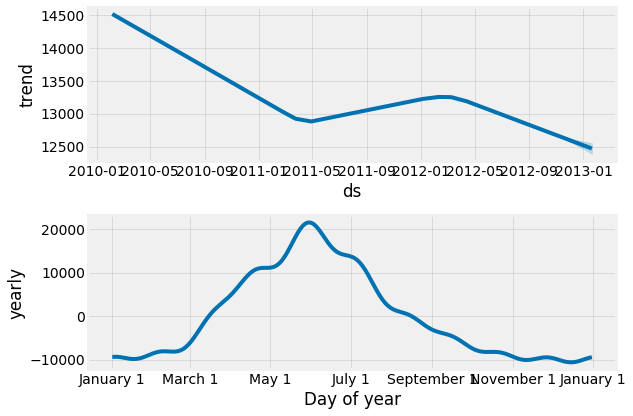

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 17
             ds
6420 2012-12-23
6421 2012-12-30
6422 2013-01-06
6423 2013-01-13
6424 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6420 2012-12-23  15711.671604  1615.562176  29292.073864
6421 2012-12-30  13429.257626  -661.335858  28331.961307
6422 2013-01-06  10307.560241 -3554.509665  22926.518342
6423 2013-01-13   8241.957368 -7340.922847  22713.054467
6424 2013-01-20   8110.852063 -7349.281725  22596.676300
Forcasting


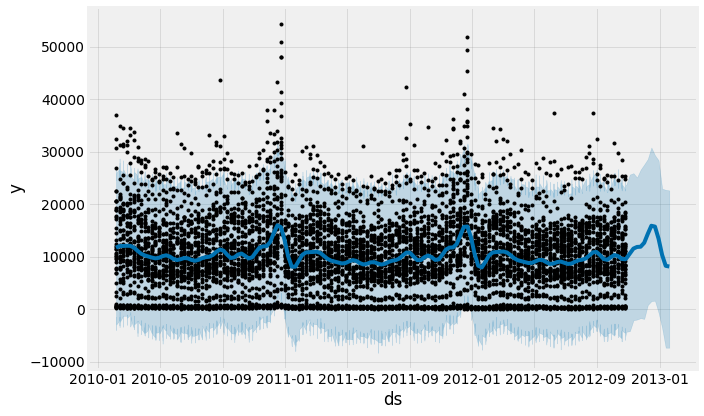

Model Intepretation


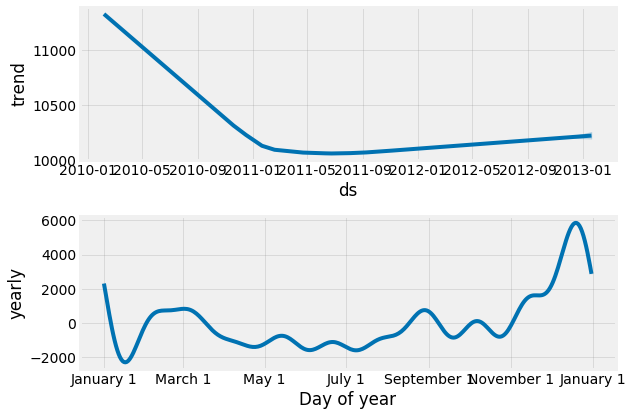

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 18
             ds
5037 2012-12-23
5038 2012-12-30
5039 2013-01-06
5040 2013-01-13
5041 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
5037 2012-12-23  25960.960191   8651.732194  44811.017268
5038 2012-12-30  14443.498534  -3297.052015  32333.577945
5039 2013-01-06   6779.849317  -9753.133500  27143.079149
5040 2013-01-13   2529.226452 -15280.254847  21832.109330
5041 2013-01-20    626.230422 -16985.189281  19314.624386
Forcasting


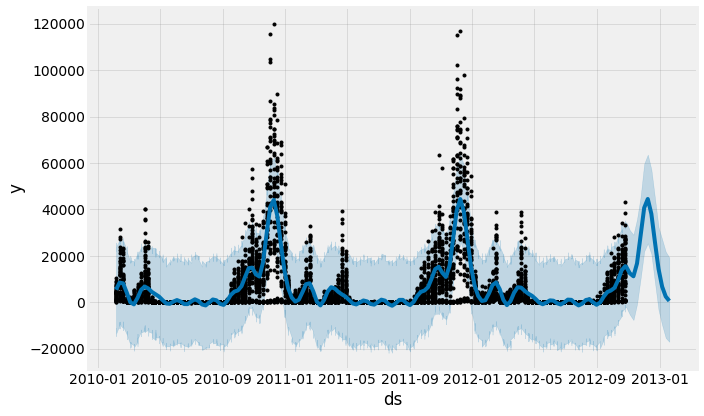

Model Intepretation


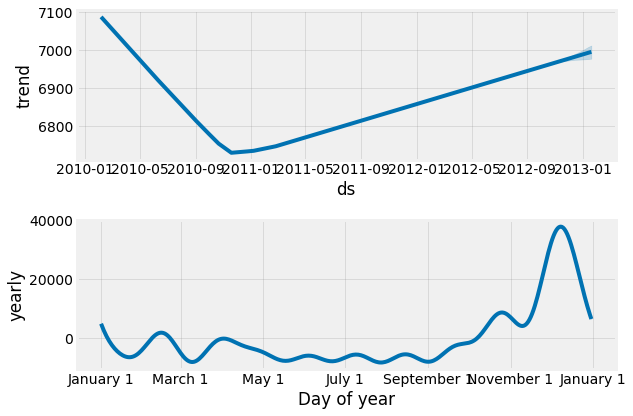

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 19
             ds
4127 2012-12-23
4128 2012-12-30
4129 2013-01-06
4130 2013-01-13
4131 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
4127 2012-12-23  1830.518973  -821.280432  4738.503616
4128 2012-12-30  1496.953011 -1376.677343  4243.313132
4129 2013-01-06  1287.753571 -1330.916898  4196.631428
4130 2013-01-13  1269.621070 -1494.826410  3969.978897
4131 2013-01-20  1366.235516 -1504.863334  4126.630036
Forcasting


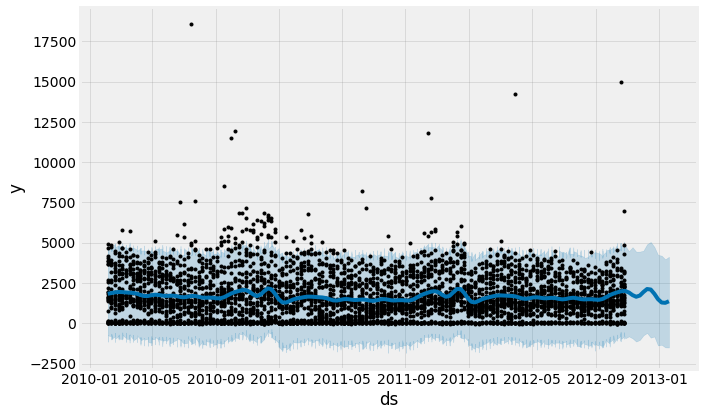

Model Intepretation


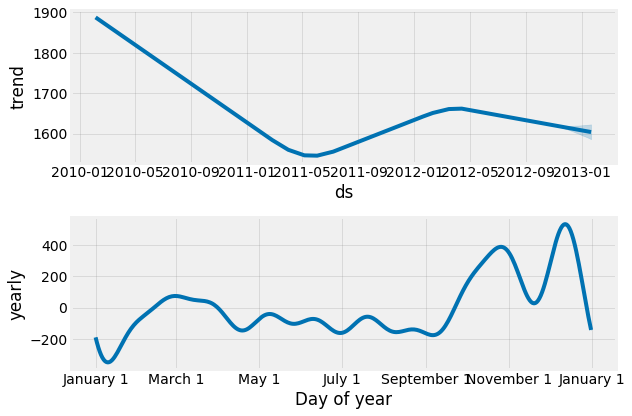

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 20
             ds
6040 2012-12-23
6041 2012-12-30
6042 2013-01-06
6043 2013-01-13
6044 2013-01-20
             ds         yhat   yhat_lower    yhat_upper
6040 2012-12-23  5422.885646 -1864.864251  12802.953282
6041 2012-12-30  5464.830692 -1961.080649  13193.591367
6042 2013-01-06  5060.297867 -2108.822545  12952.444153
6043 2013-01-13  4511.120327 -2962.592447  11950.040601
6044 2013-01-20  4336.733065 -3401.239366  11794.382770
Forcasting


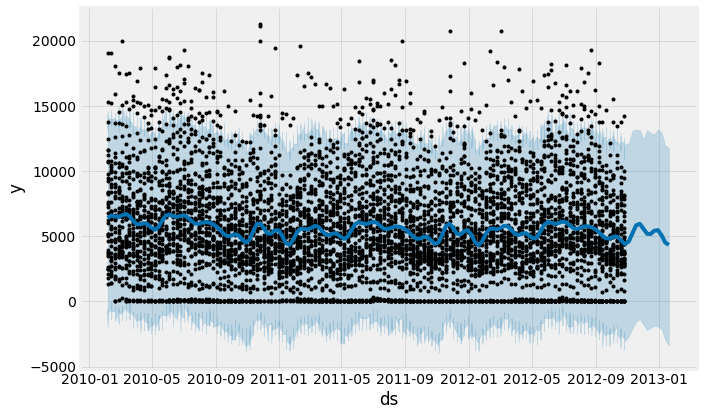

Model Intepretation


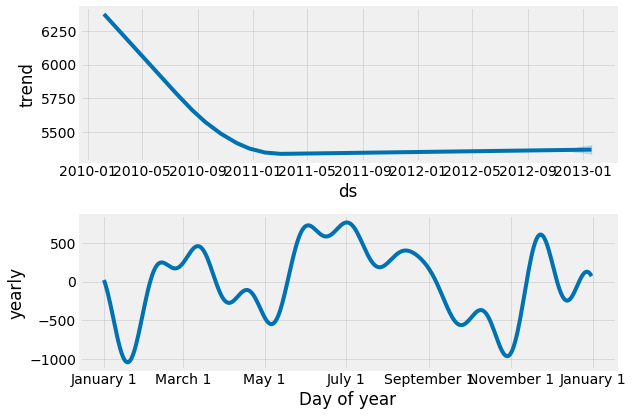

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 21
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds         yhat   yhat_lower    yhat_upper
6443 2012-12-23  7309.246367  1297.819748  13616.464653
6444 2012-12-30  5867.822758  -500.497878  12124.851980
6445 2013-01-06  4174.138770 -2164.487365  10516.097925
6446 2013-01-13  3257.786154 -2938.288569   8968.953759
6447 2013-01-20  3390.072989 -2861.681351   9701.944669
Forcasting


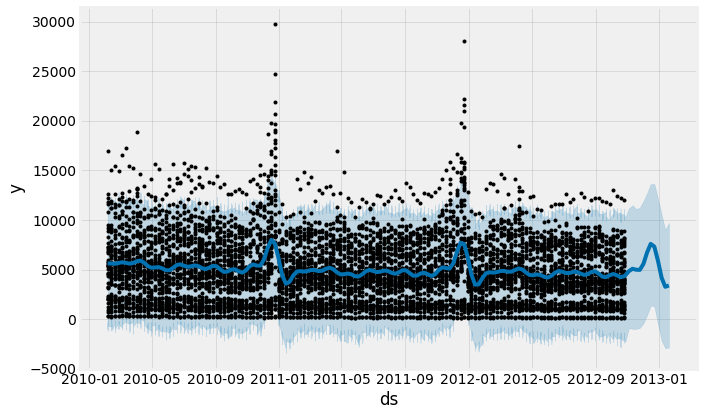

Model Intepretation


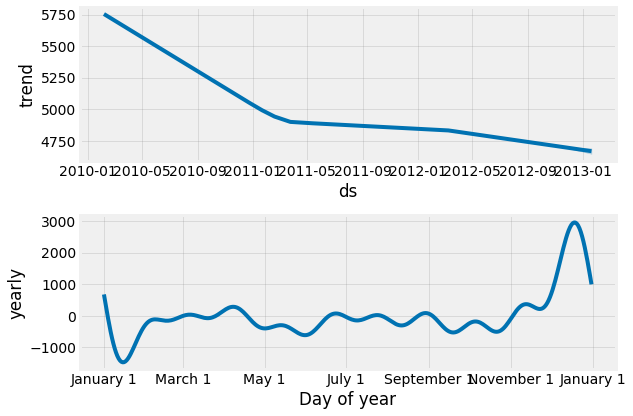

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 22
             ds
5551 2012-12-23
5552 2012-12-30
5553 2013-01-06
5554 2013-01-13
5555 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
5551 2012-12-23  15753.153151  2839.740554  27814.345078
5552 2012-12-30  13952.309259  1489.188853  26878.514425
5553 2013-01-06  10649.482582 -2146.343323  22825.573481
5554 2013-01-13   7840.364134 -3339.269990  20528.148244
5555 2013-01-20   7316.201378 -4931.854448  19610.792711
Forcasting


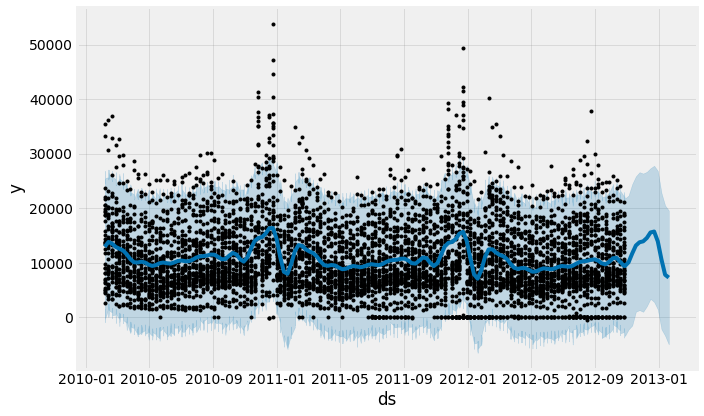

Model Intepretation


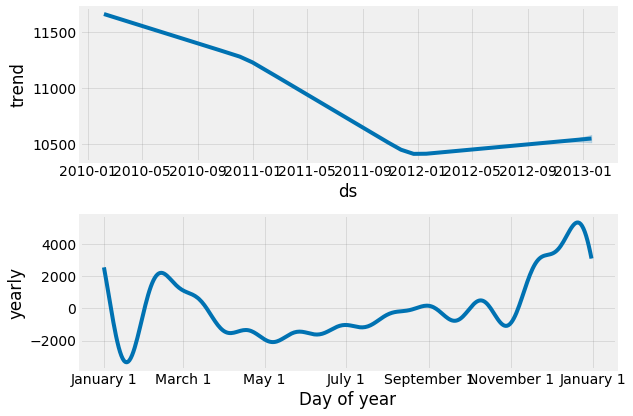

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 23
             ds
5782 2012-12-23
5783 2012-12-30
5784 2013-01-06
5785 2013-01-13
5786 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
5782 2012-12-23  44699.100295  13594.379586  74522.467156
5783 2012-12-30  34543.776341   3121.396342  65903.836061
5784 2013-01-06  22115.044180  -9764.007529  52564.472214
5785 2013-01-13  14717.028256 -15184.913527  43478.518280
5786 2013-01-20  14894.610360 -14988.589112  45350.136866
Forcasting


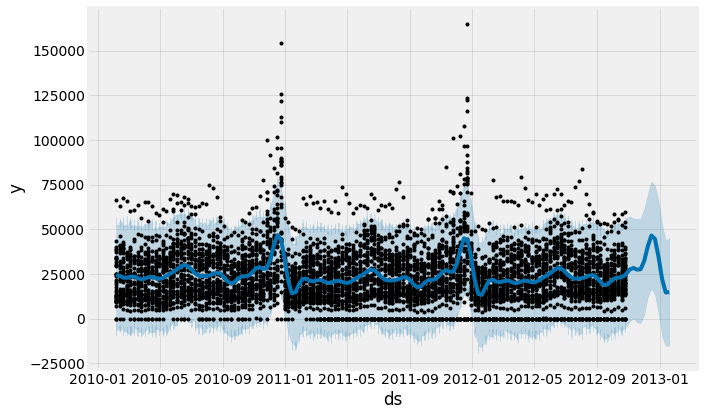

Model Intepretation


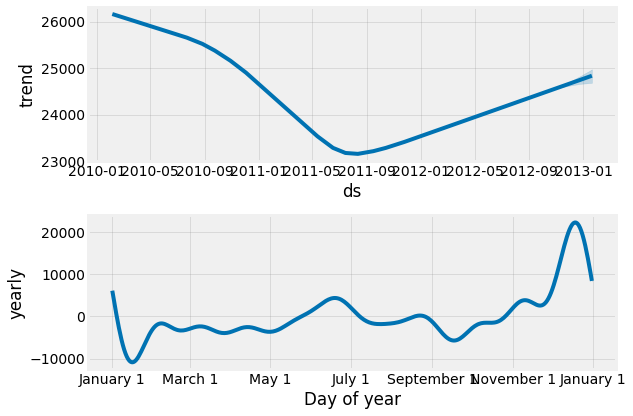

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 24
             ds
5414 2012-12-23
5415 2012-12-30
5416 2013-01-06
5417 2013-01-13
5418 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
5414 2012-12-23  10817.030157  2754.653822  18346.082631
5415 2012-12-30   7595.649347  -477.165934  15282.342426
5416 2013-01-06   4480.513561 -2666.326543  11762.989571
5417 2013-01-13   3010.349542 -4258.114994  10574.708675
5418 2013-01-20   3433.367355 -4676.076300  11553.844203
Forcasting


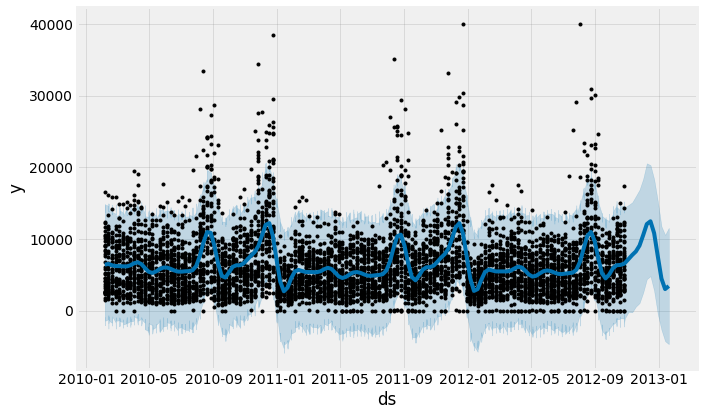

Model Intepretation


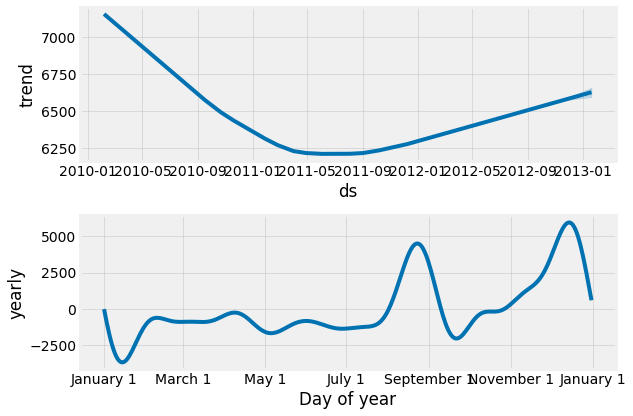

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 25
             ds
6362 2012-12-23
6363 2012-12-30
6364 2013-01-06
6365 2013-01-13
6366 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6362 2012-12-23  12195.908979  -614.897482  24460.400629
6363 2012-12-30  10072.027007 -2112.057991  22849.760860
6364 2013-01-06   7442.366324 -4886.872458  18989.667978
6365 2013-01-13   5847.924679 -6188.299499  17423.916695
6366 2013-01-20   5923.017492 -6599.675639  18224.242328
Forcasting


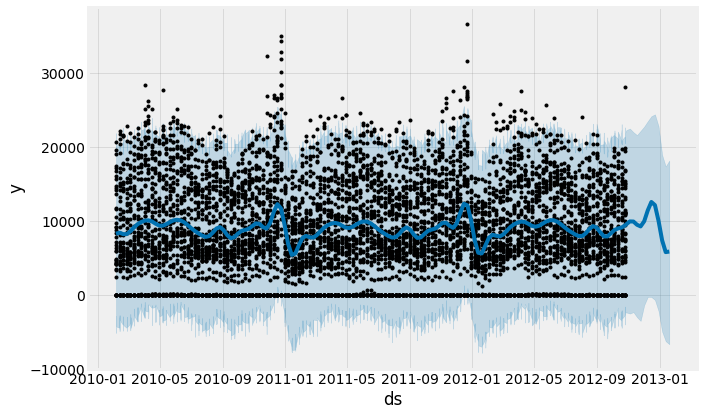

Model Intepretation


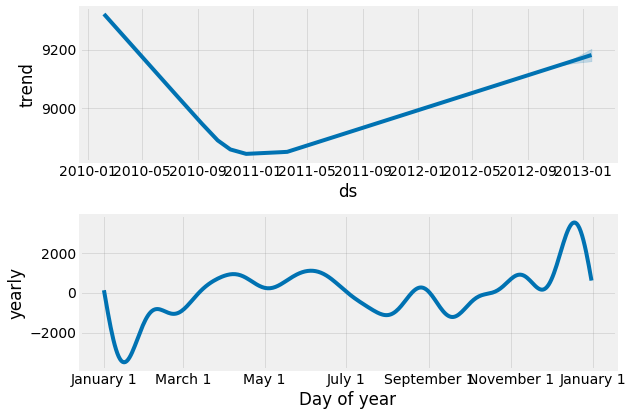

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 26
             ds
5747 2012-12-23
5748 2012-12-30
5749 2013-01-06
5750 2013-01-13
5751 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
5747 2012-12-23  10331.985210  1131.779369  19442.735981
5748 2012-12-30   7704.545527 -2455.530042  18129.853963
5749 2013-01-06   4948.519232 -3871.079199  13965.202140
5750 2013-01-13   3606.065435 -5375.560546  13434.717974
5751 2013-01-20   4206.515215 -5723.684082  13766.389995
Forcasting


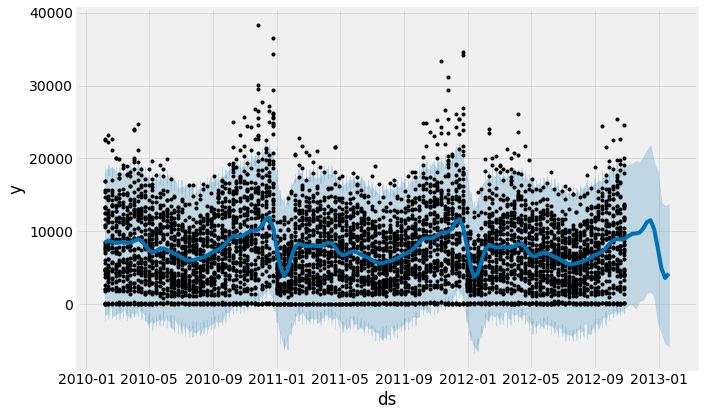

Model Intepretation


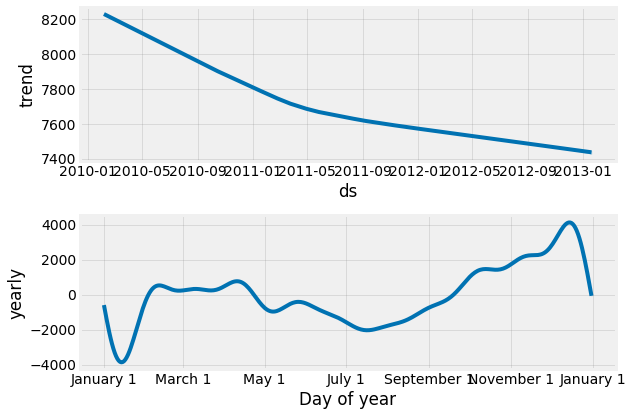

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 27
             ds
5627 2012-12-23
5628 2012-12-30
5629 2013-01-06
5630 2013-01-13
5631 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
5627 2012-12-23  3930.302335  1860.142562  5844.670347
5628 2012-12-30  3121.700568   989.599081  5036.279715
5629 2013-01-06  2110.970965    64.293706  4111.014602
5630 2013-01-13  1511.845066  -619.400467  3415.188562
5631 2013-01-20  1528.288933  -393.267500  3302.233126
Forcasting


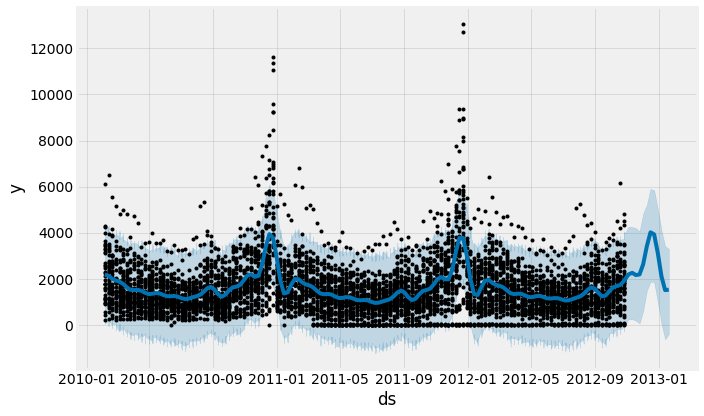

Model Intepretation


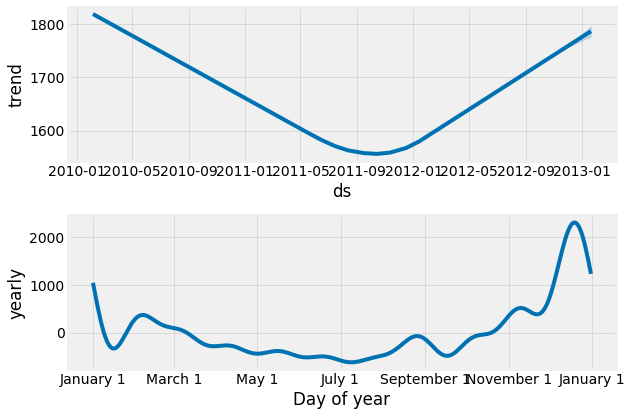

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 28
             ds
6132 2012-12-23
6133 2012-12-30
6134 2013-01-06
6135 2013-01-13
6136 2013-01-20
             ds        yhat  yhat_lower   yhat_upper
6132 2012-12-23  931.637475   43.982293  1745.669522
6133 2012-12-30  770.555822  -64.432570  1601.369449
6134 2013-01-06  636.150557 -207.550061  1421.722109
6135 2013-01-13  591.819626 -264.335916  1469.971062
6136 2013-01-20  617.940829 -216.290460  1434.076851
Forcasting


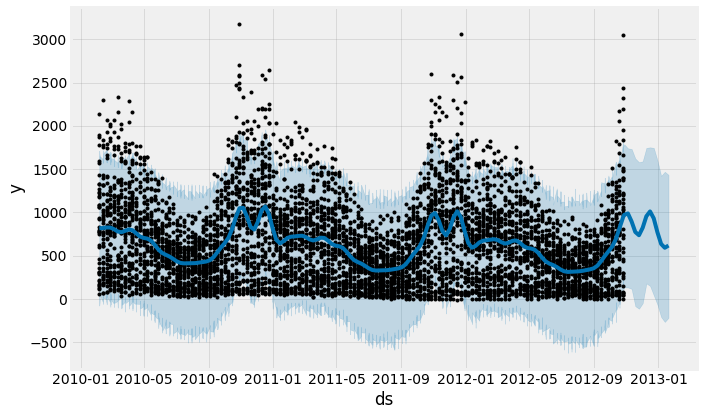

Model Intepretation


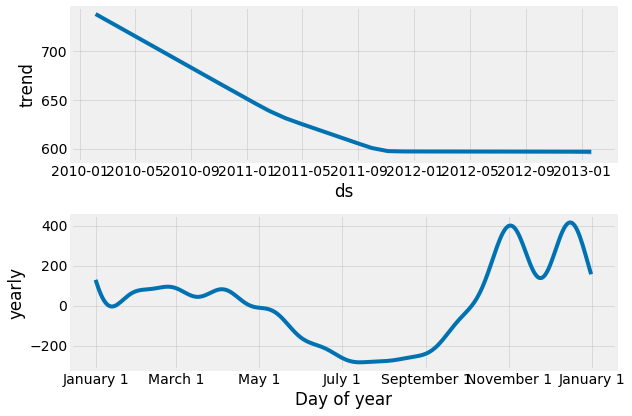

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 29
             ds
5316 2012-12-23
5317 2012-12-30
5318 2013-01-06
5319 2013-01-13
5320 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
5316 2012-12-23  11227.059670  4374.314889  18052.341500
5317 2012-12-30   9111.951216  1648.726833  16002.532495
5318 2013-01-06   6096.602701  -254.186910  12851.631472
5319 2013-01-13   4046.207670 -2185.232842  11407.249756
5320 2013-01-20   3923.364564 -2377.658527  11258.332155
Forcasting


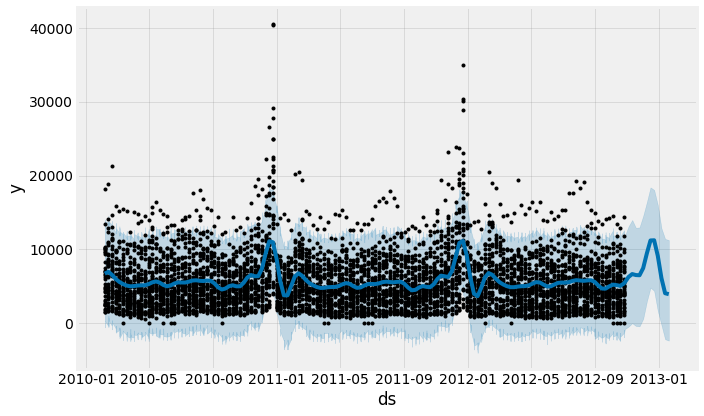

Model Intepretation


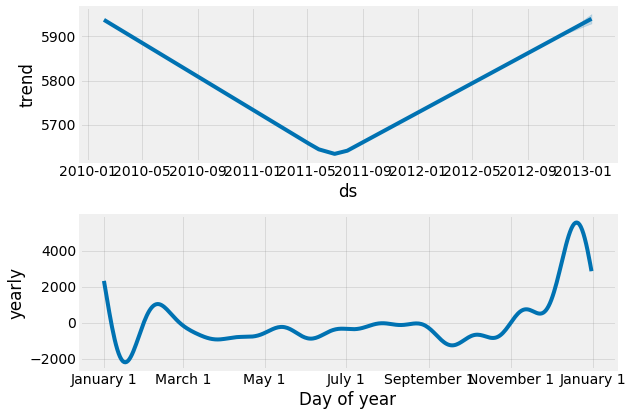

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 30
             ds
5299 2012-12-23
5300 2012-12-30
5301 2013-01-06
5302 2013-01-13
5303 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
5299 2012-12-23  3374.455273 -1447.106239  7925.508529
5300 2012-12-30  3197.935094 -1580.016359  7998.395699
5301 2013-01-06  2747.013053 -2309.128694  7188.676865
5302 2013-01-13  2358.433849 -2421.670187  6963.590936
5303 2013-01-20  2370.553623 -2421.287783  7030.458017
Forcasting


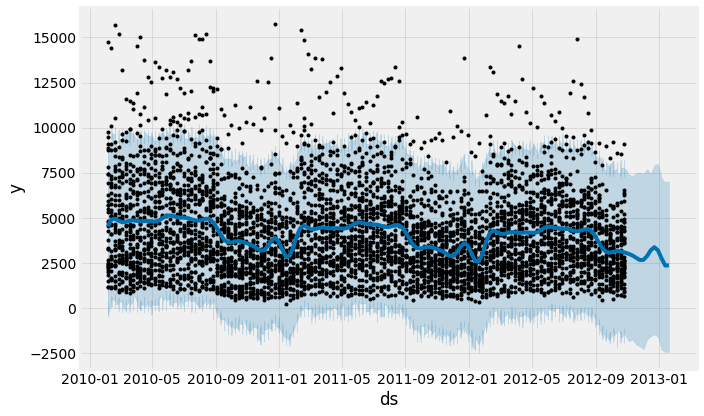

Model Intepretation


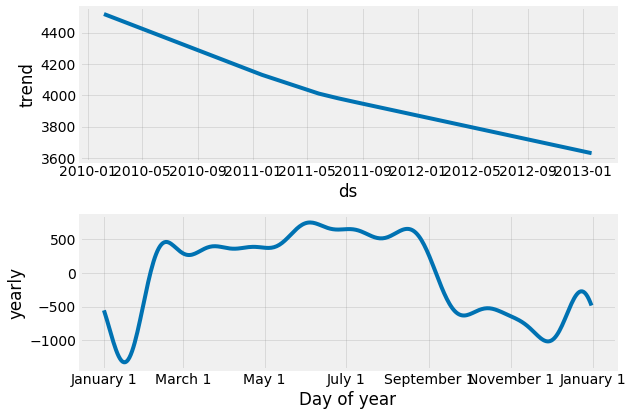

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 31
             ds
6075 2012-12-23
6076 2012-12-30
6077 2013-01-06
6078 2013-01-13
6079 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
6075 2012-12-23  4296.867711   875.423845  8038.560042
6076 2012-12-30  3123.379742  -239.704735  6626.927600
6077 2013-01-06  1868.844907 -1752.494418  5373.141212
6078 2013-01-13  1264.421414 -2280.134858  4599.677948
6079 2013-01-20  1372.927548 -2215.484582  4964.605448
Forcasting


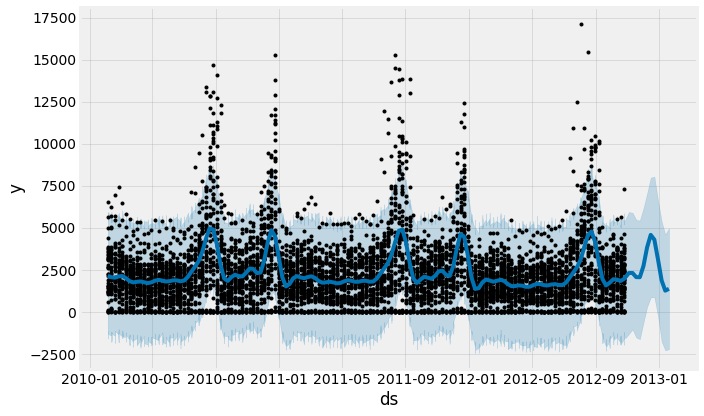

Model Intepretation


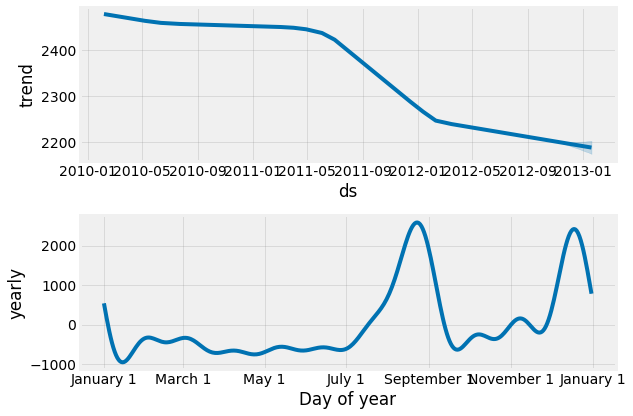

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 32
             ds
5964 2012-12-23
5965 2012-12-30
5966 2013-01-06
5967 2013-01-13
5968 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
5964 2012-12-23  19138.403587  8757.020699  29339.611629
5965 2012-12-30  14788.664431  5108.159192  25952.474508
5966 2013-01-06   7511.598043 -2801.253390  18112.692027
5967 2013-01-13   1979.117775 -8578.863292  12387.423580
5968 2013-01-20   1090.198538 -8234.451765  10880.895330
Forcasting


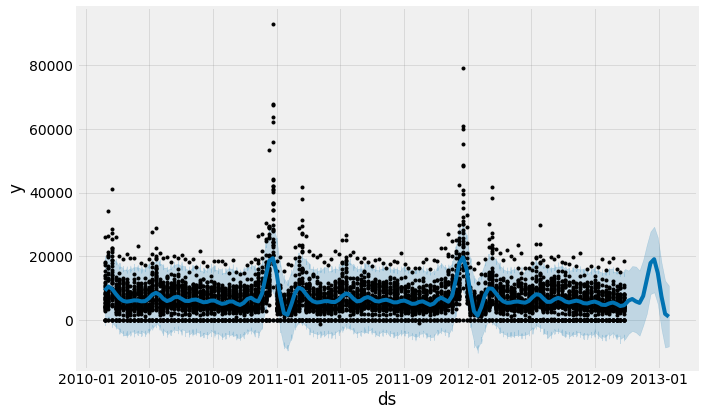

Model Intepretation


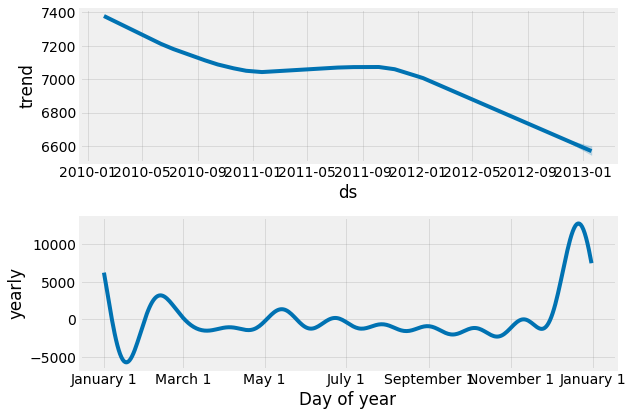

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 33
             ds
5398 2012-12-23
5399 2012-12-30
5400 2013-01-06
5401 2013-01-13
5402 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
5398 2012-12-23  11465.324284  4814.043089  18821.741063
5399 2012-12-30   8272.671837   537.254618  16146.292365
5400 2013-01-06   4829.298590 -3057.669547  12534.916990
5401 2013-01-13   2958.559304 -4365.359988  11085.774323
5402 2013-01-20   3300.320153 -4594.861043  11648.582652
Forcasting


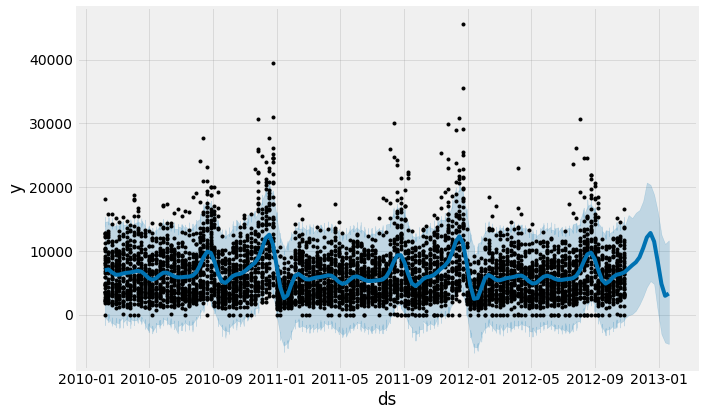

Model Intepretation


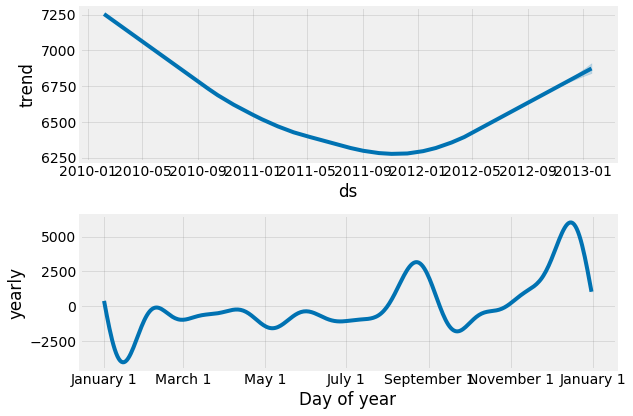

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 34
             ds
5334 2012-12-23
5335 2012-12-30
5336 2013-01-06
5337 2013-01-13
5338 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
5334 2012-12-23  18523.393335  2100.616576  35029.122146
5335 2012-12-30  16235.420909    27.948961  33520.589405
5336 2013-01-06  12911.462260 -4560.132668  28949.390623
5337 2013-01-13  10496.450167 -6394.870438  26707.357269
5338 2013-01-20  10415.017202 -6693.276109  27017.636370
Forcasting


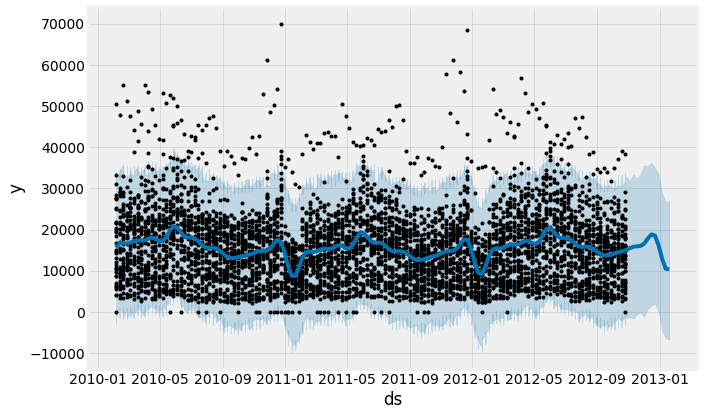

Model Intepretation


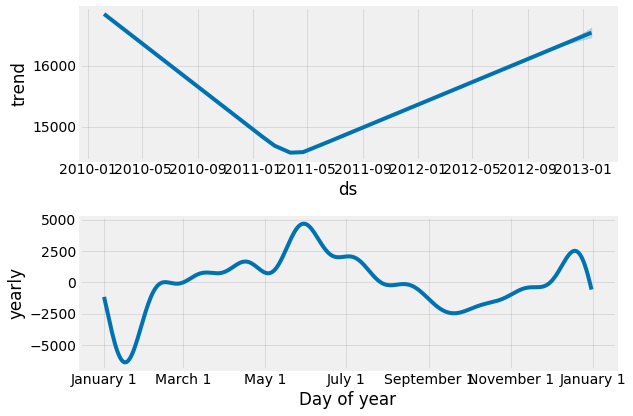

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 35
             ds
5305 2012-12-23
5306 2012-12-30
5307 2013-01-06
5308 2013-01-13
5309 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
5305 2012-12-23  3240.476516     4.251656  6461.851787
5306 2012-12-30  2626.121547  -954.470682  5754.616590
5307 2013-01-06  1819.507862 -1406.046085  5206.242252
5308 2013-01-13  1299.740767 -2153.523303  4638.073951
5309 2013-01-20  1331.621850 -2043.067056  4709.394192
Forcasting


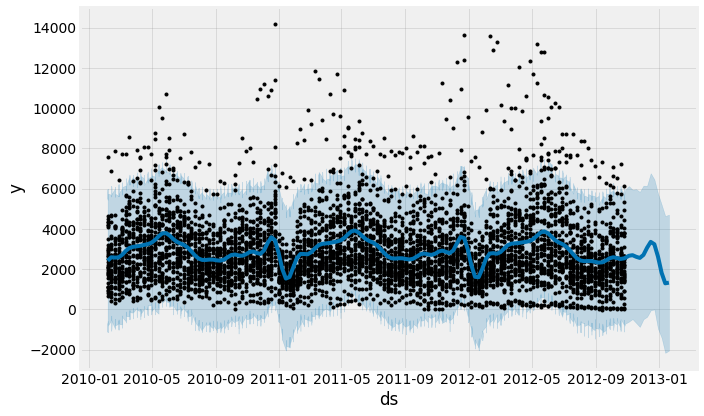

Model Intepretation


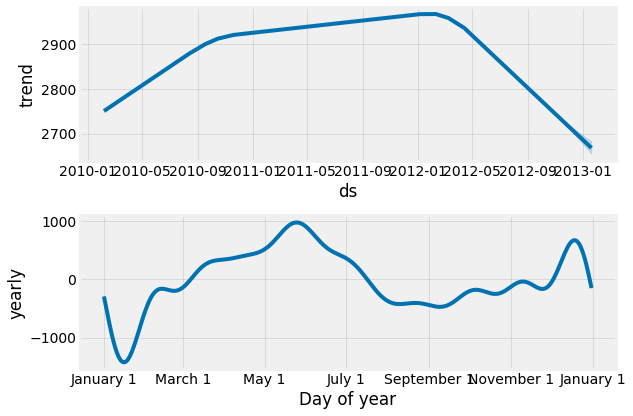

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 36
             ds
5303 2012-12-23
5304 2012-12-30
5305 2013-01-06
5306 2013-01-13
5307 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
5303 2012-12-23  2562.954978  -327.099760  5660.439712
5304 2012-12-30  1927.539777 -1227.928994  5010.407818
5305 2013-01-06  1011.593738 -1778.486039  4013.107416
5306 2013-01-13   341.572470 -2626.429204  3335.520839
5307 2013-01-20   287.004151 -2655.704518  3217.327808
Forcasting


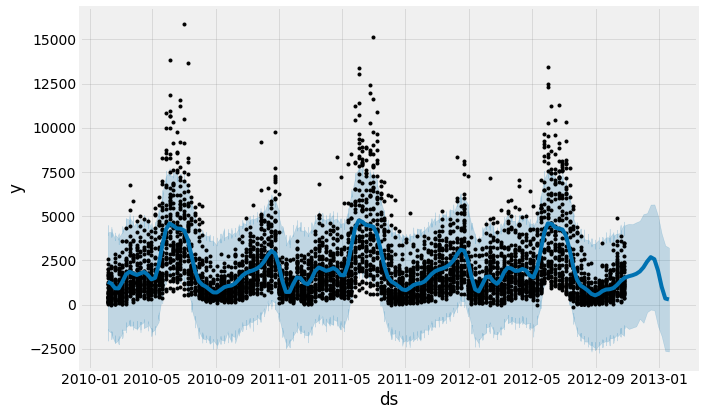

Model Intepretation


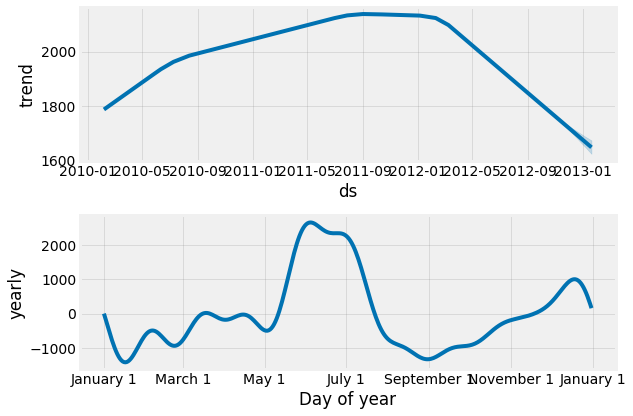

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 37
             ds
2585 2012-12-23
2586 2012-12-30
2587 2013-01-06
2588 2013-01-13
2589 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
2585 2012-12-23  3133.513169  1357.483665  4780.962918
2586 2012-12-30  3031.898108  1310.848389  4549.694172
2587 2013-01-06  2904.373982   971.984130  4591.426922
2588 2013-01-13  2814.051082  1091.734519  4537.690657
2589 2013-01-20  2820.428793  1087.470642  4492.798738
Forcasting


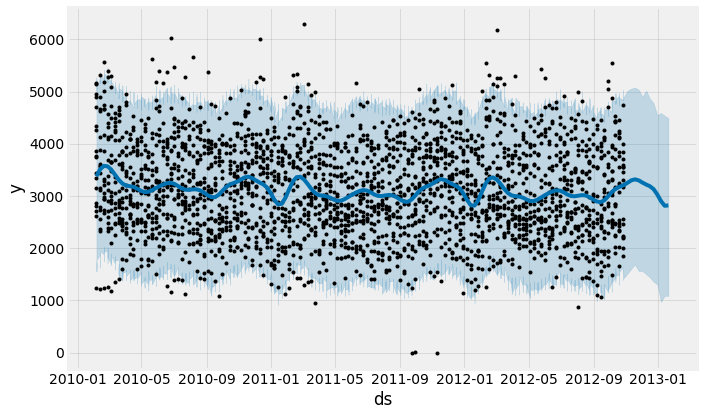

Model Intepretation


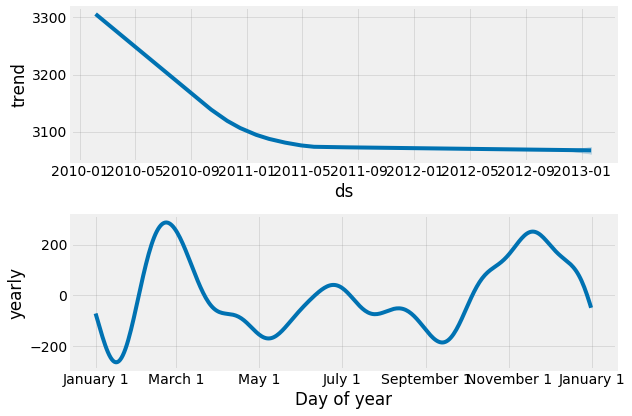

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 38
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower     yhat_upper
6443 2012-12-23  59936.393526  13979.195635  109369.476794
6444 2012-12-30  59741.595001  16379.669508  106839.306613
6445 2013-01-06  62020.511777  15466.074246  106644.753585
6446 2013-01-13  65104.936947  17124.671356  112462.159830
6447 2013-01-20  66372.053157  18814.814336  115498.764102
Forcasting


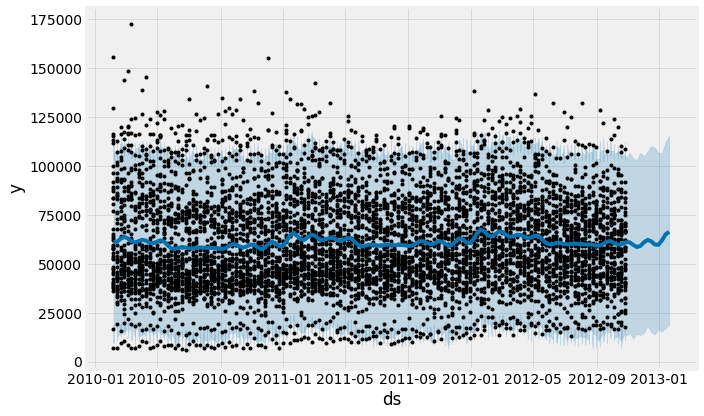

Model Intepretation


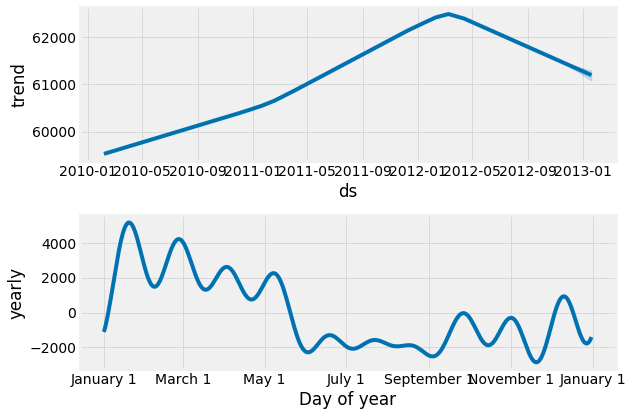

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 40
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6443 2012-12-23  49117.679573  9999.730378  91495.925337
6444 2012-12-30  48728.524526  7871.324805  94834.000348
6445 2013-01-06  48130.697090  6109.297875  89205.806162
6446 2013-01-13  47960.691743  5102.968702  92680.884088
6447 2013-01-20  48292.005387  4806.899630  89931.545832
Forcasting


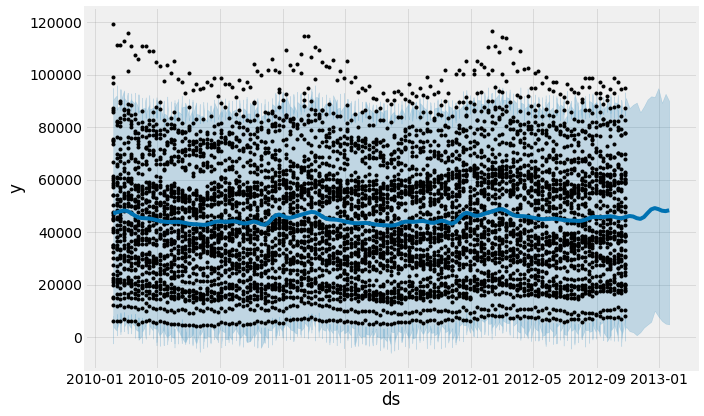

Model Intepretation


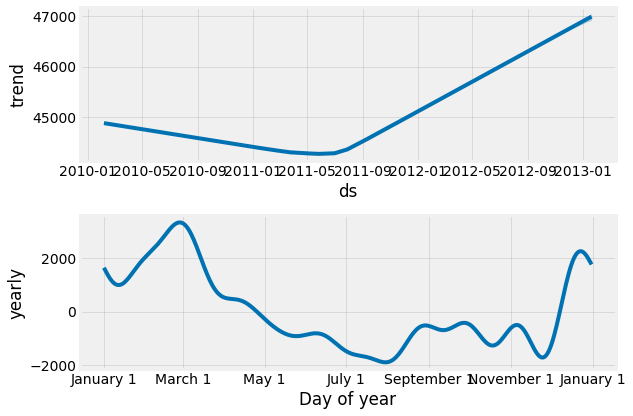

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 41
             ds
5401 2012-12-23
5402 2012-12-30
5403 2013-01-06
5404 2013-01-13
5405 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
5401 2012-12-23  4632.659493  -450.888833  9724.098407
5402 2012-12-30  3138.651543 -1413.467293  8289.372131
5403 2013-01-06  1298.619473 -3875.681876  6230.340462
5404 2013-01-13   307.176997 -4739.288737  5031.803812
5405 2013-01-20   561.352156 -4880.908632  5766.231445
Forcasting


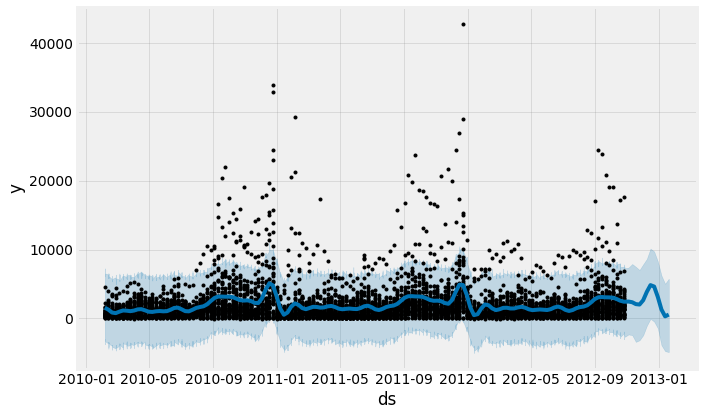

Model Intepretation


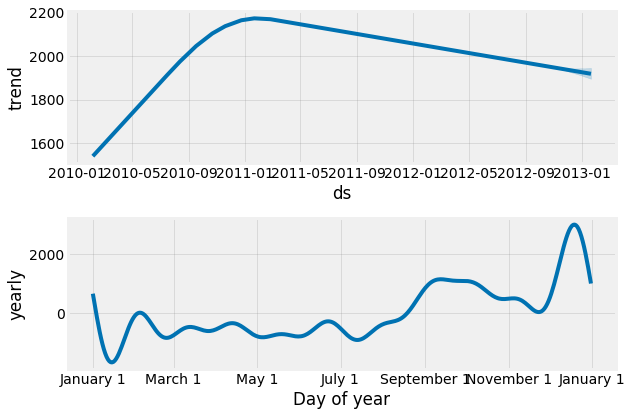

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 42
             ds
6409 2012-12-23
6410 2012-12-30
6411 2013-01-06
6412 2013-01-13
6413 2013-01-20
             ds         yhat   yhat_lower    yhat_upper
6409 2012-12-23  4917.121775 -1534.348521  11145.937968
6410 2012-12-30  4922.131744  -935.522644  11449.186754
6411 2013-01-06  4841.176462 -1159.962148  11553.977138
6412 2013-01-13  4751.322181 -1606.345465  11011.172081
6413 2013-01-20  4752.995809 -1749.661575  11079.572425
Forcasting


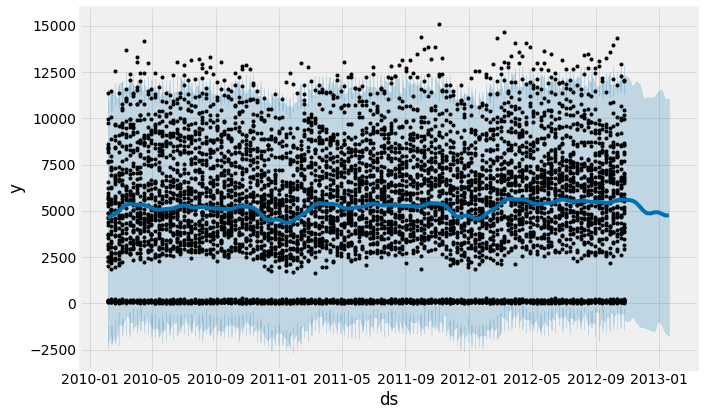

Model Intepretation


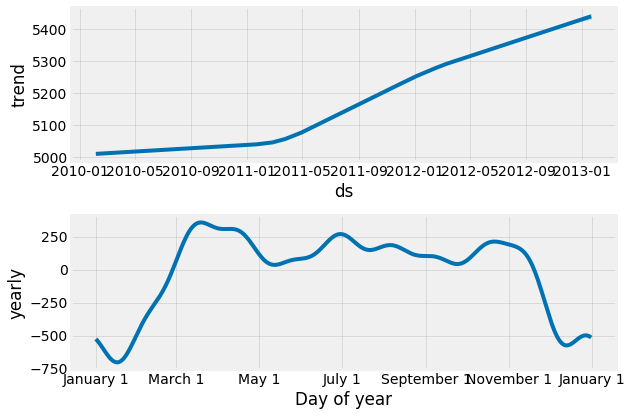

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 44
             ds
5479 2012-12-23
5480 2012-12-30
5481 2013-01-06
5482 2013-01-13
5483 2013-01-20
             ds         yhat   yhat_lower    yhat_upper
5479 2012-12-23  7561.005628  2688.360174  12460.579730
5480 2012-12-30  5691.068162   689.662231  10289.185644
5481 2013-01-06  4060.755567  -641.864663   8390.812639
5482 2013-01-13  3454.759680 -1387.199399   8366.226054
5483 2013-01-20  3855.540409 -1123.174385   8564.687405
Forcasting


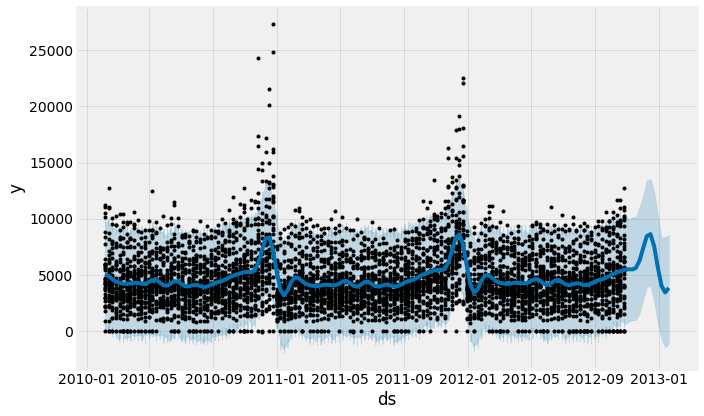

Model Intepretation


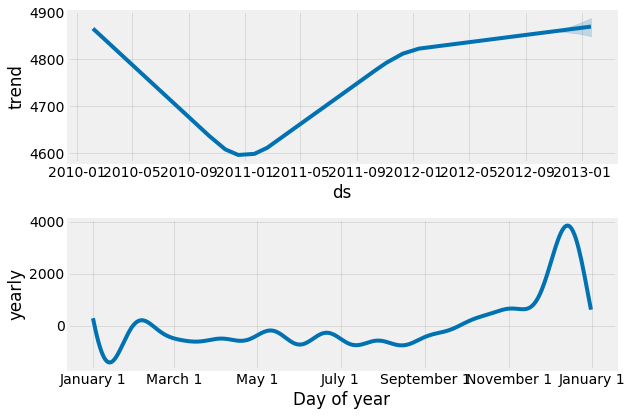

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 45
             ds
1944 2012-12-23
1945 2012-12-30
1946 2013-01-06
1947 2013-01-13
1948 2013-01-20
             ds       yhat  yhat_lower  yhat_upper
1944 2012-12-23  22.938009  -27.264886   69.545713
1945 2012-12-30  23.417963  -25.242612   70.511413
1946 2013-01-06  23.968861  -22.849545   71.811243
1947 2013-01-13  24.648097  -21.389206   70.607157
1948 2013-01-20  24.866702  -25.227086   74.247094
Forcasting


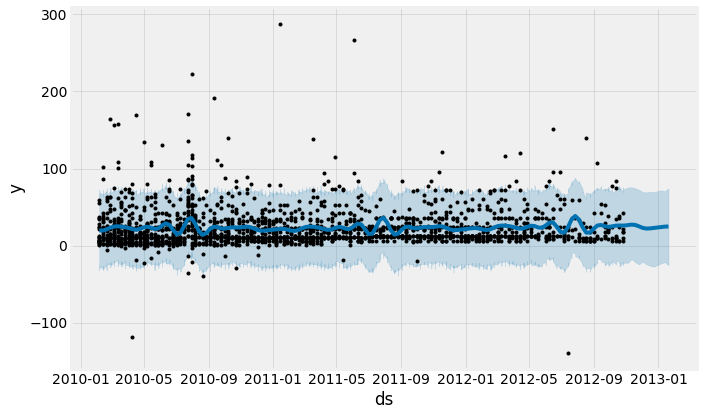

Model Intepretation


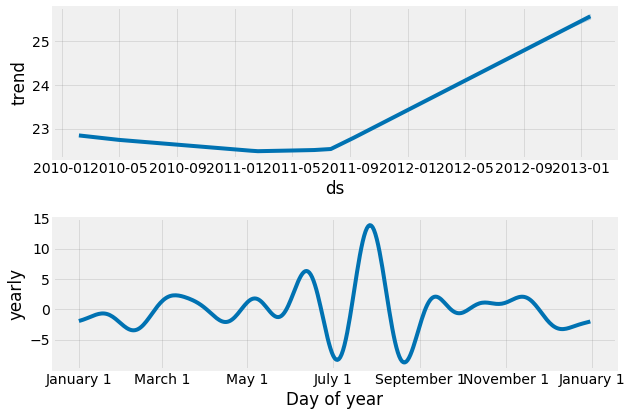

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 46
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6443 2012-12-23  32008.481170  8273.220073  58797.791825
6444 2012-12-30  27274.232155  2487.786090  53395.768843
6445 2013-01-06  20478.733980 -4144.976549  45948.499657
6446 2013-01-13  16102.927033 -8345.392501  41529.486871
6447 2013-01-20  16031.921550 -9366.983476  39254.156383
Forcasting


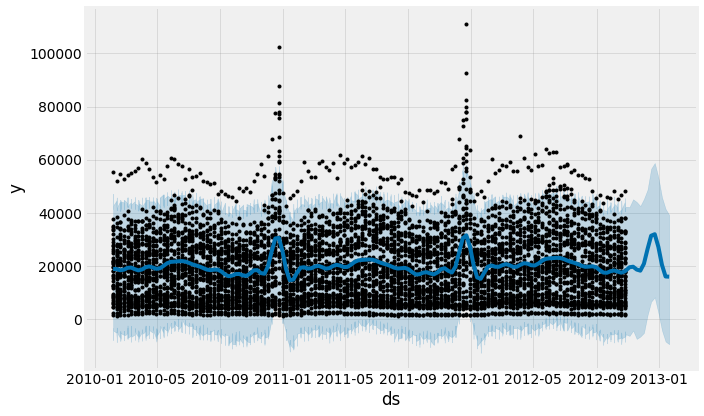

Model Intepretation


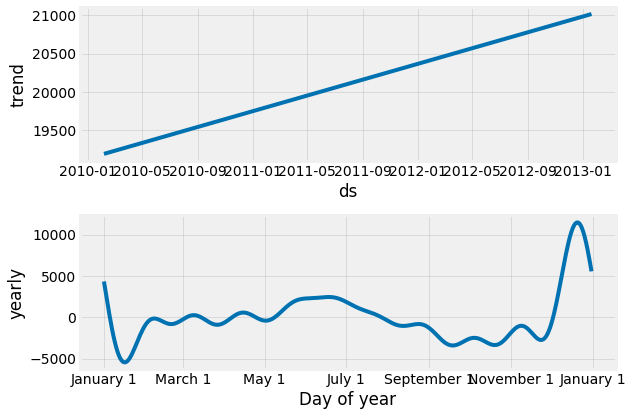

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 47
            ds
654 2012-12-23
655 2012-12-30
656 2013-01-06
657 2013-01-13
658 2013-01-20
            ds       yhat  yhat_lower  yhat_upper
654 2012-12-23  35.156874 -554.508809  640.433109
655 2012-12-30 -26.002685 -632.325695  535.618955
656 2013-01-06 -25.039653 -584.660760  580.246095
657 2013-01-13  14.676879 -594.385382  586.484041
658 2013-01-20  41.894858 -571.211138  638.053975
Forcasting


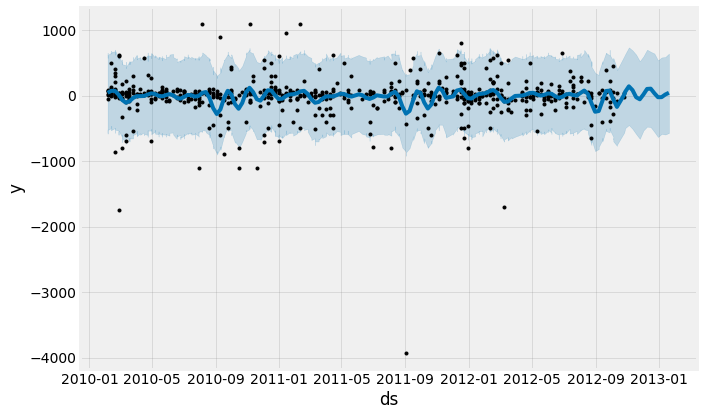

Model Intepretation


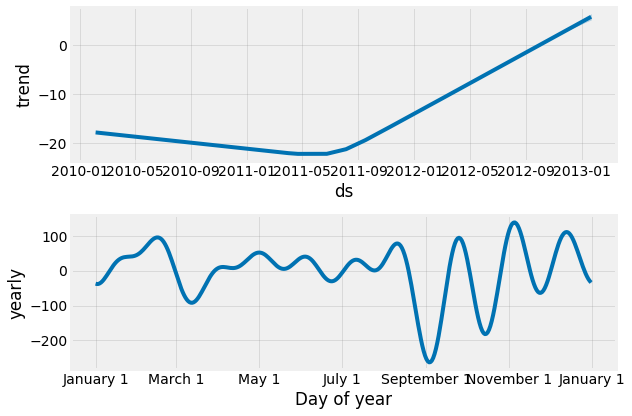

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 48
             ds
1750 2012-12-23
1751 2012-12-30
1752 2013-01-06
1753 2013-01-13
1754 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
1750 2012-12-23  3956.446230  1650.007207  6117.340281
1751 2012-12-30  3472.467100  1390.407017  5669.756049
1752 2013-01-06  2692.319707   726.032088  4921.222914
1753 2013-01-13  2088.352082  -202.486147  4192.520719
1754 2013-01-20  1964.075686  -276.027477  4079.118195
Forcasting


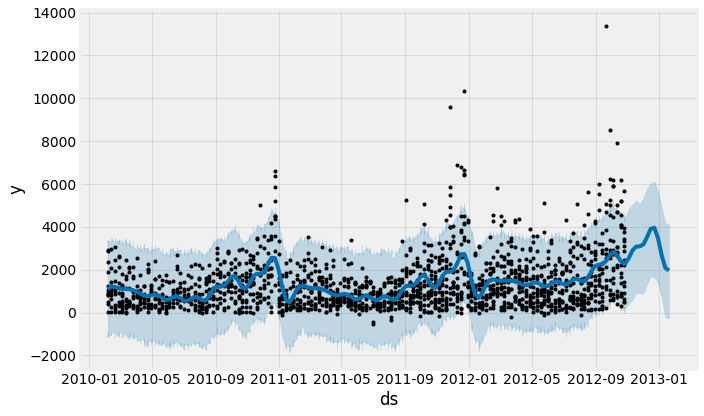

Model Intepretation


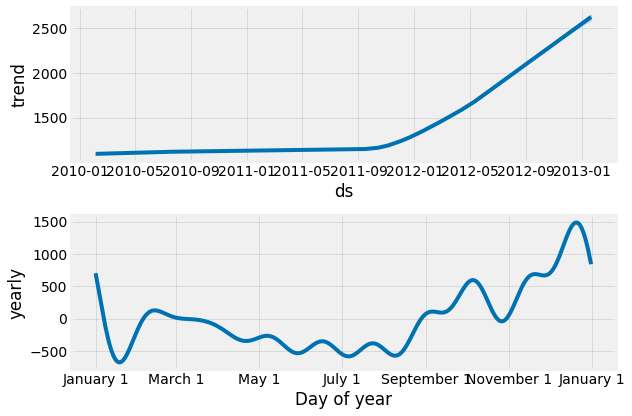

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 49
             ds
4490 2012-12-23
4491 2012-12-30
4492 2013-01-06
4493 2013-01-13
4494 2013-01-20
             ds         yhat   yhat_lower    yhat_upper
4490 2012-12-23  5394.753974 -7033.435863  18230.293287
4491 2012-12-30  5675.295285 -7456.039430  19108.149268
4492 2013-01-06  5973.373431 -5954.864148  18725.141229
4493 2013-01-13  6148.788657 -6339.768399  18791.243106
4494 2013-01-20  6166.910643 -6050.288670  18846.971439
Forcasting


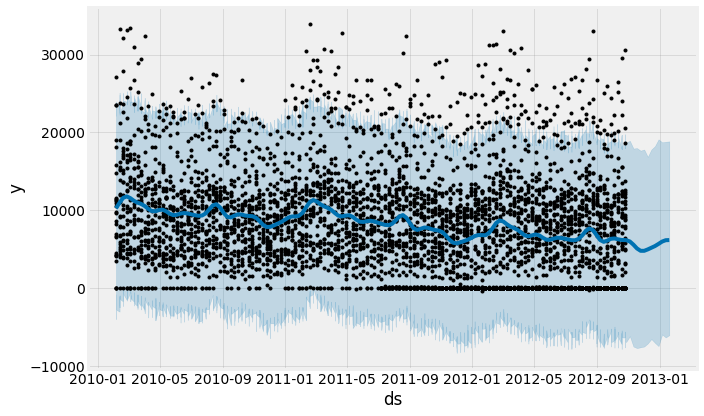

Model Intepretation


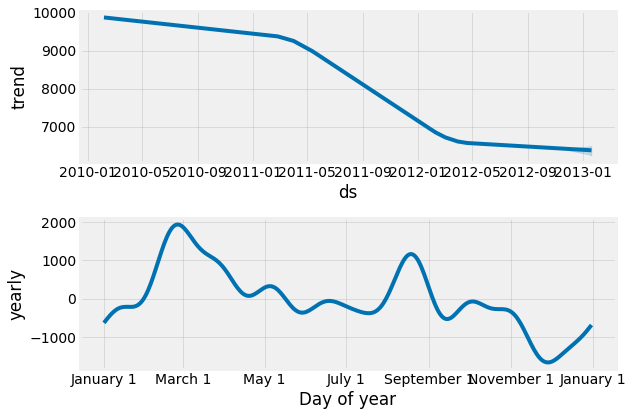

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 51
             ds
1402 2012-12-09
1403 2012-12-16
1404 2012-12-23
1405 2012-12-30
1406 2013-01-06
             ds       yhat  yhat_lower  yhat_upper
1402 2012-12-09   9.689303  -41.836127   68.438890
1403 2012-12-16  13.712665  -45.484601   66.189999
1404 2012-12-23  12.686058  -38.047350   66.329435
1405 2012-12-30   7.958957  -45.874685   65.238170
1406 2013-01-06   2.327934  -54.200030   56.621956
Forcasting


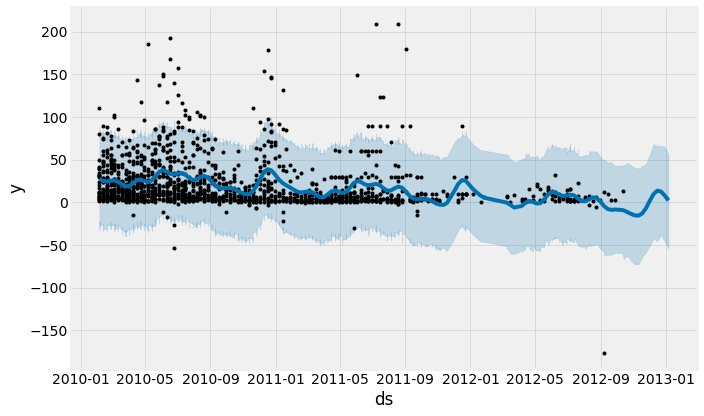

Model Intepretation


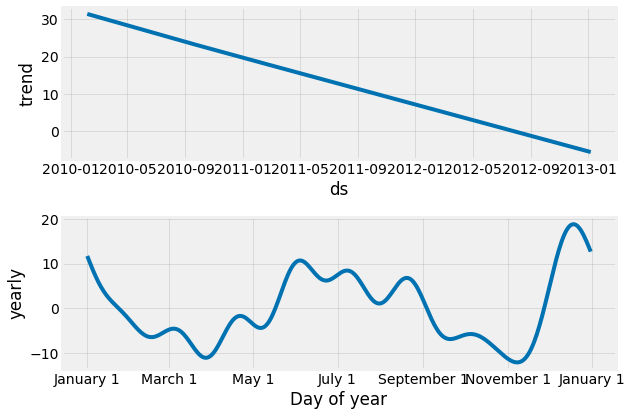

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 52
             ds
6276 2012-12-23
6277 2012-12-30
6278 2013-01-06
6279 2013-01-13
6280 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
6276 2012-12-23  2079.691255  -885.058910  4850.940951
6277 2012-12-30  1687.465029 -1346.151787  4484.110437
6278 2013-01-06  1368.222781 -1364.216439  4033.488738
6279 2013-01-13  1209.779120 -1663.513689  4145.366658
6280 2013-01-20  1229.741406 -1574.506481  4157.170629
Forcasting


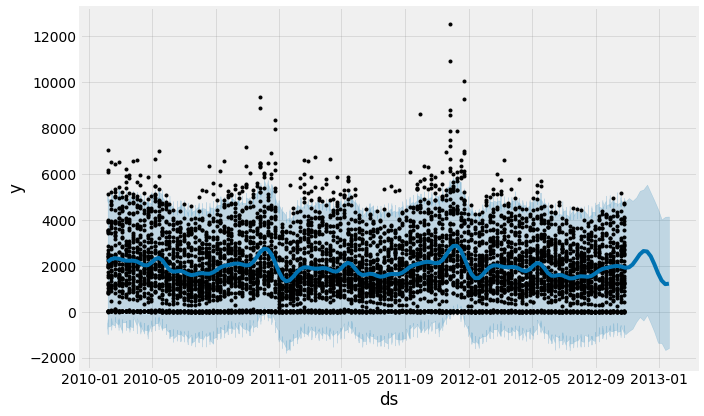

Model Intepretation


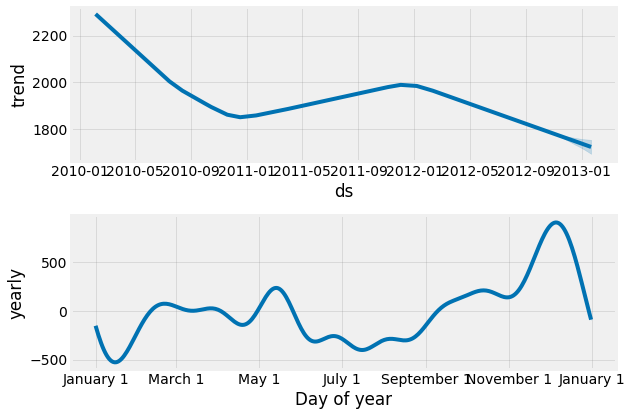

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 54
             ds
4775 2012-12-23
4776 2012-12-30
4777 2013-01-06
4778 2013-01-13
4779 2013-01-20
             ds        yhat  yhat_lower  yhat_upper
4775 2012-12-23  124.950782 -110.513709  347.686490
4776 2012-12-30   91.318239 -138.257240  323.858504
4777 2013-01-06   34.780576 -178.144410  270.734442
4778 2013-01-13   -9.872818 -253.342667  222.043966
4779 2013-01-20  -21.108240 -246.039442  235.979472
Forcasting


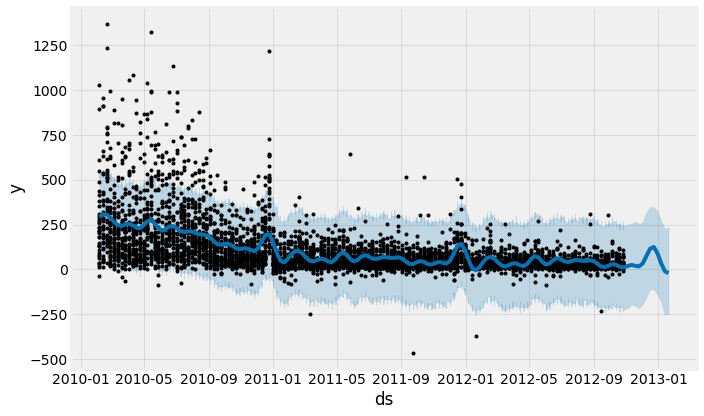

Model Intepretation


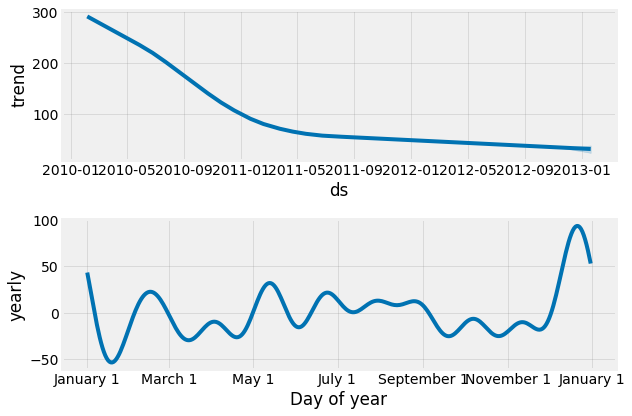

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 55
             ds
5604 2012-12-23
5605 2012-12-30
5606 2013-01-06
5607 2013-01-13
5608 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
5604 2012-12-23  31846.974079  19031.858295  45307.342431
5605 2012-12-30  25630.364206  12451.282371  38486.341371
5606 2013-01-06  14532.360002    881.618201  27915.355047
5607 2013-01-13   5525.267295  -8912.470296  19326.012082
5608 2013-01-20   3481.240373 -11575.877937  17220.755978
Forcasting


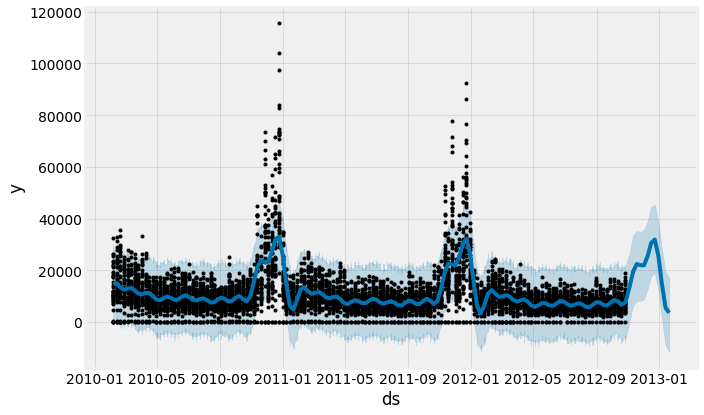

Model Intepretation


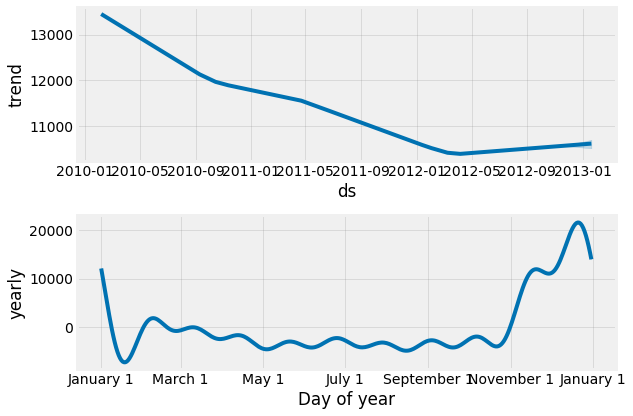

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 56
             ds
5880 2012-12-23
5881 2012-12-30
5882 2013-01-06
5883 2013-01-13
5884 2013-01-20
             ds        yhat   yhat_lower    yhat_upper
5880 2012-12-23  958.208708 -8477.065431  10779.029765
5881 2012-12-30  343.656672 -8308.152089   9725.054891
5882 2013-01-06  121.179856 -9121.038464   8925.364396
5883 2013-01-13  231.172083 -8728.296624   9120.887532
5884 2013-01-20  452.028773 -8157.818355   9288.034266
Forcasting


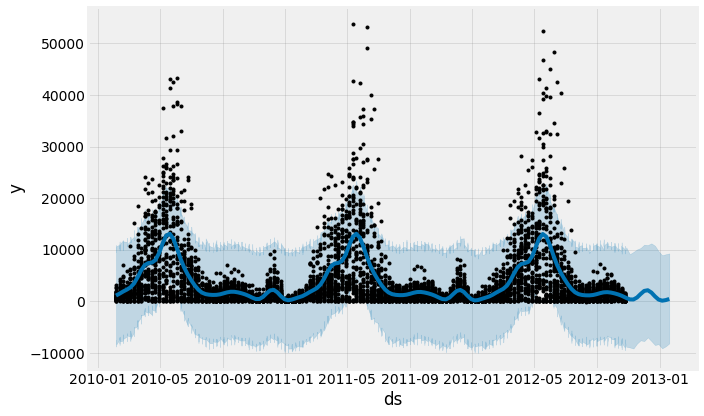

Model Intepretation


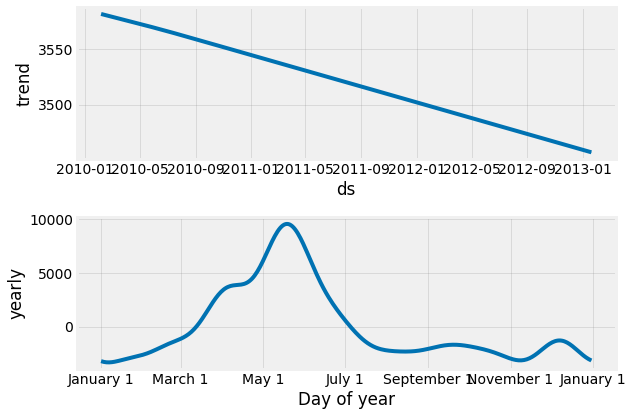

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 58
             ds
4398 2012-12-23
4399 2012-12-30
4400 2013-01-06
4401 2013-01-13
4402 2013-01-20
             ds         yhat   yhat_lower    yhat_upper
4398 2012-12-23  5018.564035 -3097.622479  13354.036453
4399 2012-12-30  4638.649729 -3455.936034  13167.275251
4400 2013-01-06  4026.875278 -3977.459371  12240.320695
4401 2013-01-13  3577.405264 -4660.937840  11551.999190
4402 2013-01-20  3565.564750 -4582.991009  11749.707003
Forcasting


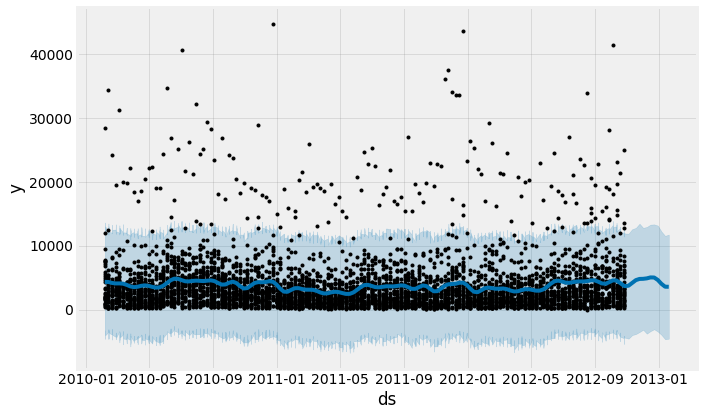

Model Intepretation


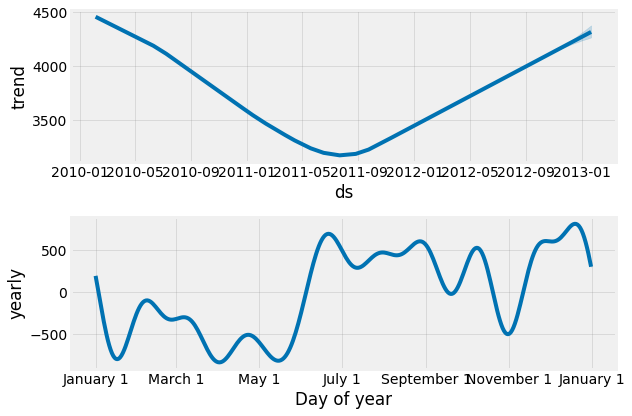

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 59
             ds
6114 2012-12-23
6115 2012-12-30
6116 2013-01-06
6117 2013-01-13
6118 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
6114 2012-12-23  6330.039681  3199.633720  9516.394026
6115 2012-12-30  4760.505865  1754.472160  7862.774526
6116 2013-01-06  2141.715469 -1008.164555  5214.450648
6117 2013-01-13   166.219768 -3000.628543  3407.563396
6118 2013-01-20  -290.433881 -3555.525920  3010.528982
Forcasting


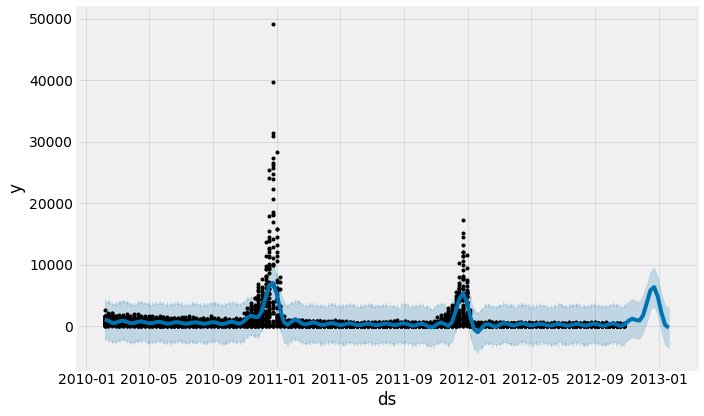

Model Intepretation


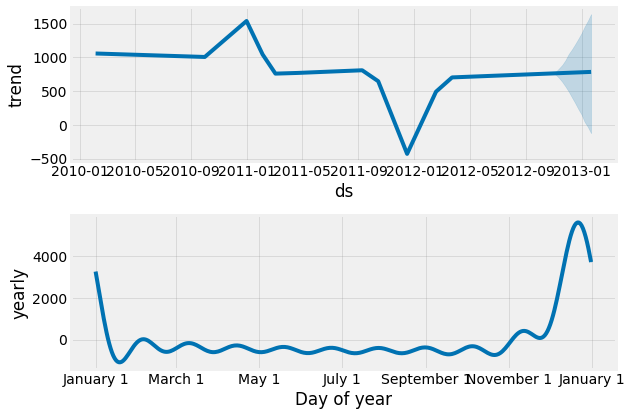

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 60
             ds
5780 2012-12-23
5781 2012-12-30
5782 2013-01-06
5783 2013-01-13
5784 2013-01-20
             ds        yhat  yhat_lower   yhat_upper
5780 2012-12-23  567.704710   50.507858  1093.318335
5781 2012-12-30  388.809411 -136.750734   942.397132
5782 2013-01-06  269.962710 -245.608779   804.766298
5783 2013-01-13  267.008334 -242.906617   796.469404
5784 2013-01-20  330.013187 -266.453331   846.002919
Forcasting


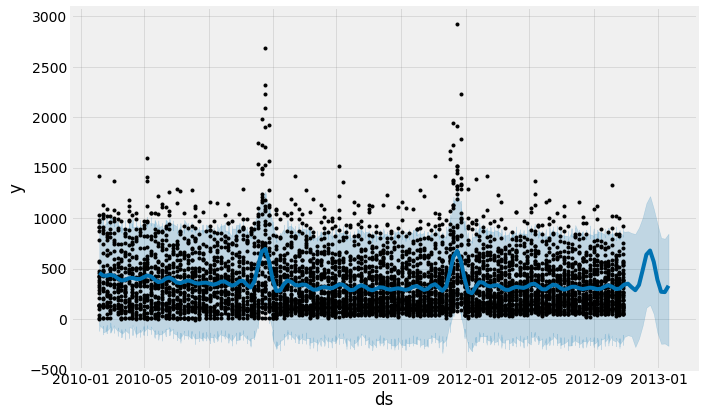

Model Intepretation


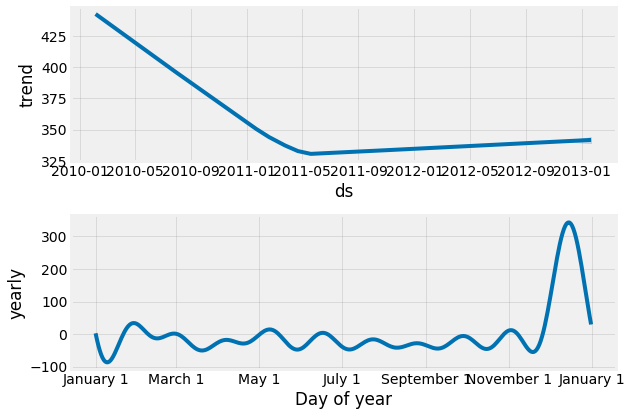

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 67
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6443 2012-12-23  13675.846759  3678.375631  24418.794907
6444 2012-12-30  10419.271138   -19.872177  20165.716876
6445 2013-01-06   6217.363113 -3826.929975  16785.848535
6446 2013-01-13   3642.891878 -7126.813124  13068.100423
6447 2013-01-20   3972.947947 -6270.381664  13813.004701
Forcasting


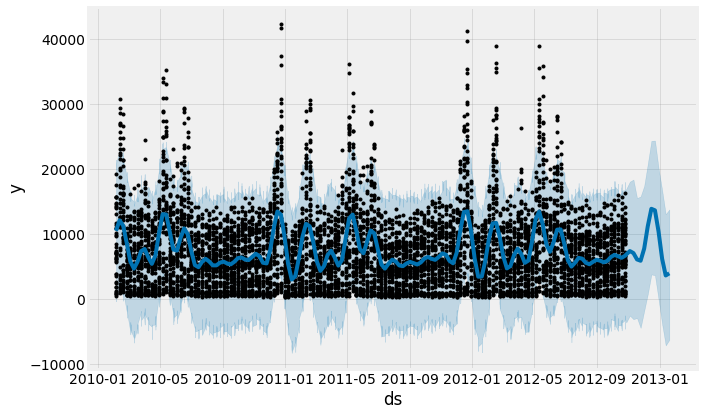

Model Intepretation


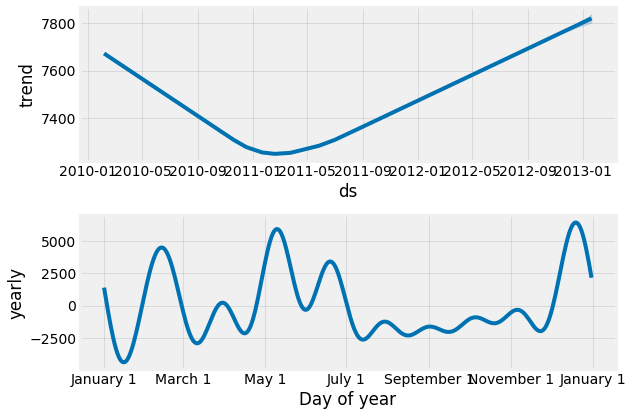

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 71
             ds
5317 2012-12-23
5318 2012-12-30
5319 2013-01-06
5320 2013-01-13
5321 2013-01-20
             ds         yhat   yhat_lower    yhat_upper
5317 2012-12-23  6796.138062 -1309.135490  13898.542536
5318 2012-12-30  6689.220598  -564.946707  14425.546645
5319 2013-01-06  5731.494452 -2146.539286  13195.973464
5320 2013-01-13  4607.701183 -3168.528759  11507.993068
5321 2013-01-20  4359.202189 -2996.488211  11578.779800
Forcasting


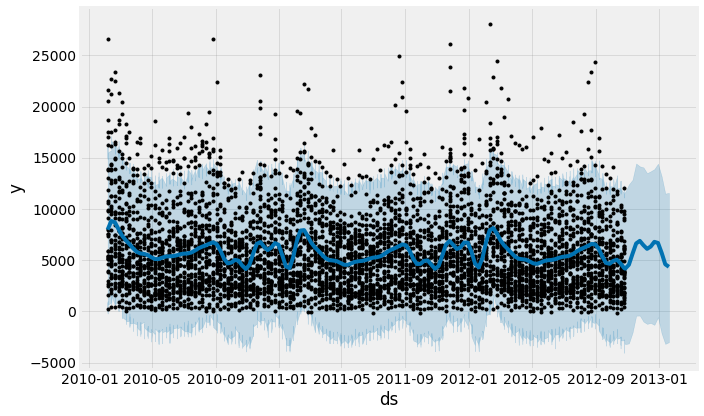

Model Intepretation


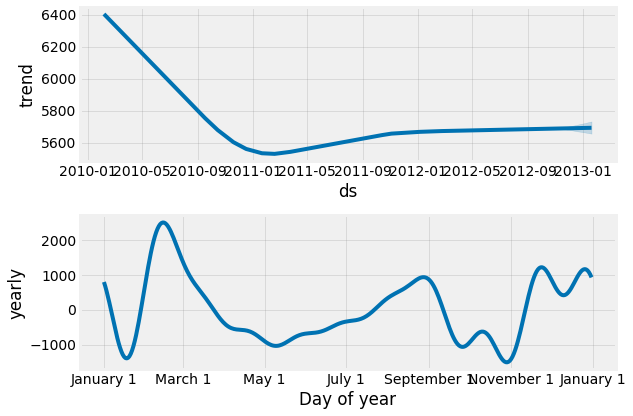

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 72
             ds
6054 2012-12-23
6055 2012-12-30
6056 2013-01-06
6057 2013-01-13
6058 2013-01-20
             ds          yhat    yhat_lower     yhat_upper
6054 2012-12-23  82958.637423    709.743289  161498.787225
6055 2012-12-30  77837.606791  -7197.707380  151553.056745
6056 2013-01-06  60273.746264 -26670.177170  141749.201507
6057 2013-01-13  39720.350168 -39269.691886  124748.926876
6058 2013-01-20  33424.942869 -43746.326086  112040.021387
Forcasting


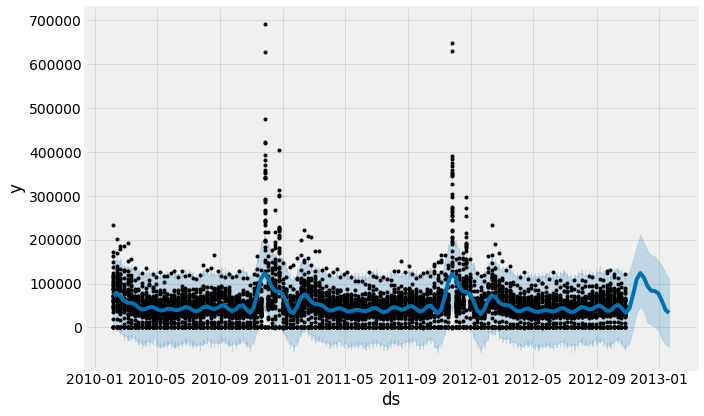

Model Intepretation


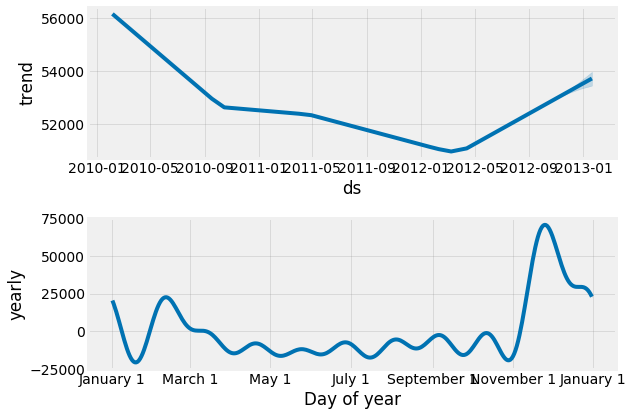

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 74
             ds
6438 2012-12-23
6439 2012-12-30
6440 2013-01-06
6441 2013-01-13
6442 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6438 2012-12-23  14135.201835 -6239.220526  35102.850134
6439 2012-12-30  16031.446161 -5375.425472  37673.659568
6440 2013-01-06  16175.017397 -4492.346567  36158.205851
6441 2013-01-13  14473.126595 -5025.372482  34603.775548
6442 2013-01-20  12485.957107 -6801.068975  31328.296209
Forcasting


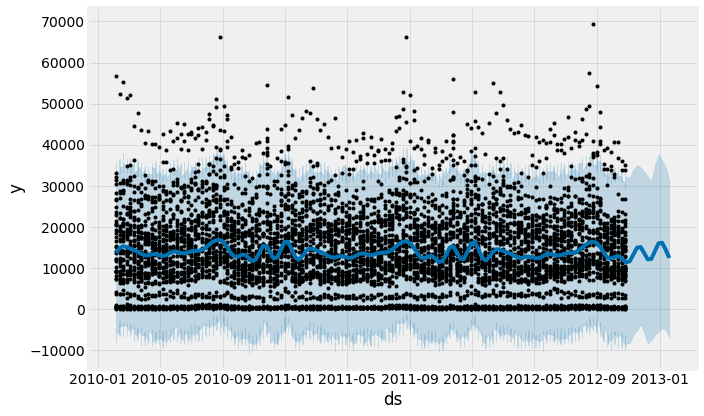

Model Intepretation


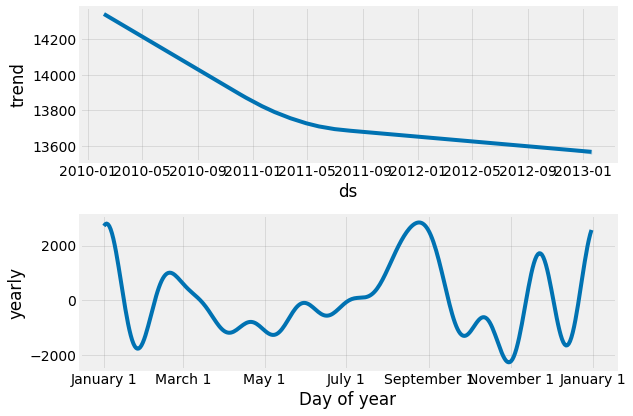

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 77
            ds
158 2012-12-23
159 2012-12-30
160 2013-01-06
161 2013-01-13
162 2013-01-20
            ds        yhat  yhat_lower  yhat_upper
158 2012-12-23  356.731071 -144.239012  820.683039
159 2012-12-30  327.004756 -130.899751  778.976606
160 2013-01-06  175.441117 -294.998649  646.086820
161 2013-01-13   68.912369 -385.978270  517.518737
162 2013-01-20  100.422771 -357.963010  553.076038
Forcasting


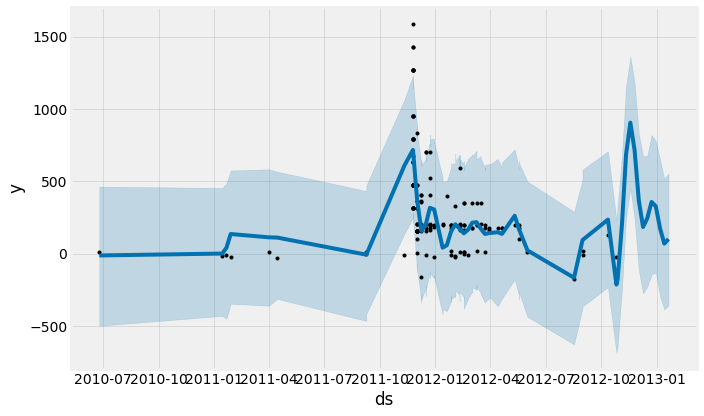

Model Intepretation


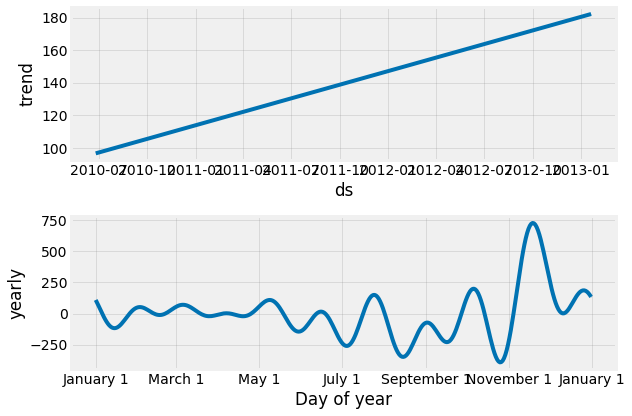

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 78
            ds
243 2012-11-04
244 2012-11-11
245 2012-11-18
246 2012-11-25
247 2012-12-02
            ds      yhat  yhat_lower  yhat_upper
243 2012-11-04  0.615016  -17.818414   17.953647
244 2012-11-11  4.470545  -14.705988   23.577671
245 2012-11-18  3.897265  -15.097107   21.404318
246 2012-11-25  0.959531  -17.585938   19.658240
247 2012-12-02  0.097579  -19.699895   17.987703
Forcasting


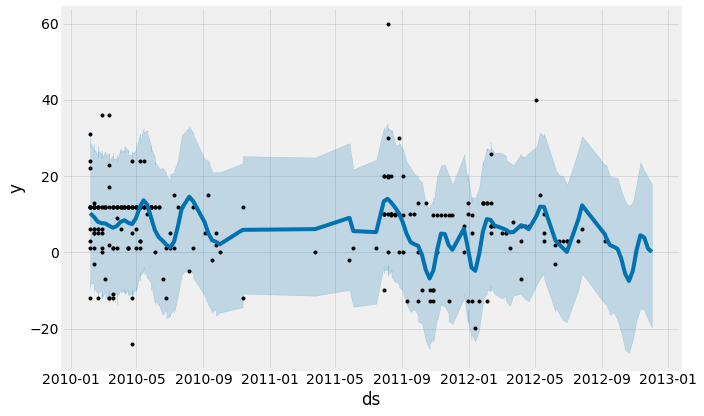

Model Intepretation


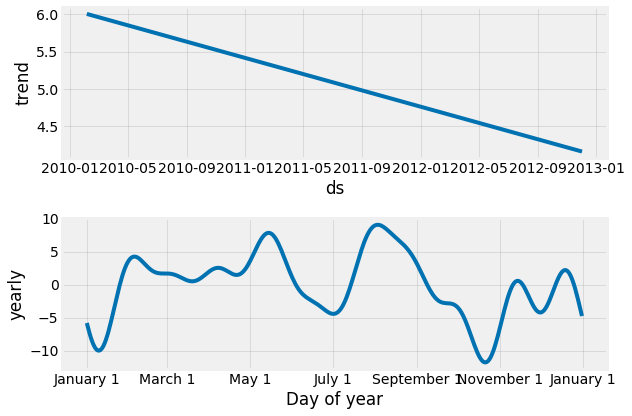

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 79
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6443 2012-12-23  22635.415845 -3179.581780  49084.112562
6444 2012-12-30  21495.398049 -5839.806290  49139.587825
6445 2013-01-06  20194.320503 -7028.905099  45679.796441
6446 2013-01-13  19783.722384 -6663.988660  47126.720809
6447 2013-01-20  20635.554063 -5829.124370  46214.316636
Forcasting


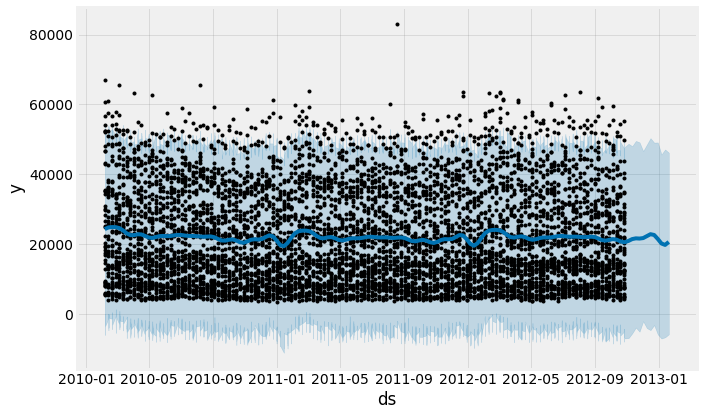

Model Intepretation


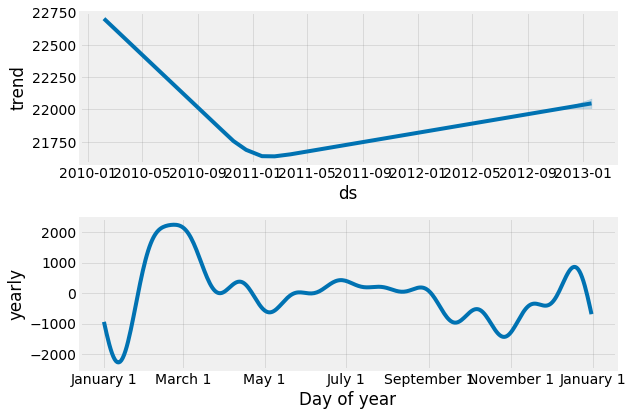

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 80
             ds
5899 2012-12-23
5900 2012-12-30
5901 2013-01-06
5902 2013-01-13
5903 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
5899 2012-12-23  12284.126768  -7370.215747  32594.769130
5900 2012-12-30  11790.014798  -9842.085687  33163.750128
5901 2013-01-06  11218.024382  -8931.205602  31823.294780
5902 2013-01-13  11097.207164 -10033.674907  31860.669496
5903 2013-01-20  11498.616690  -9038.232080  32885.833707
Forcasting


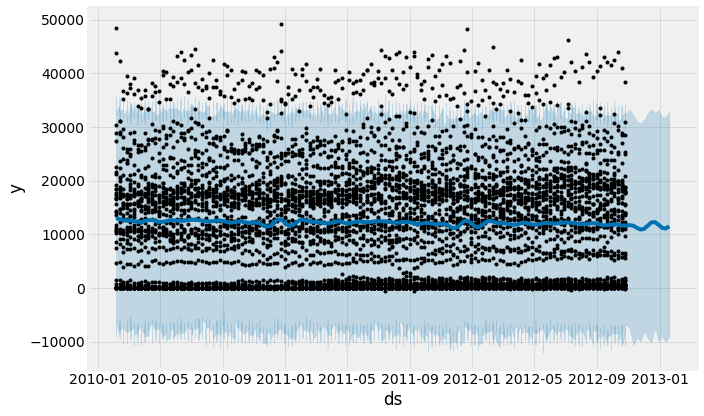

Model Intepretation


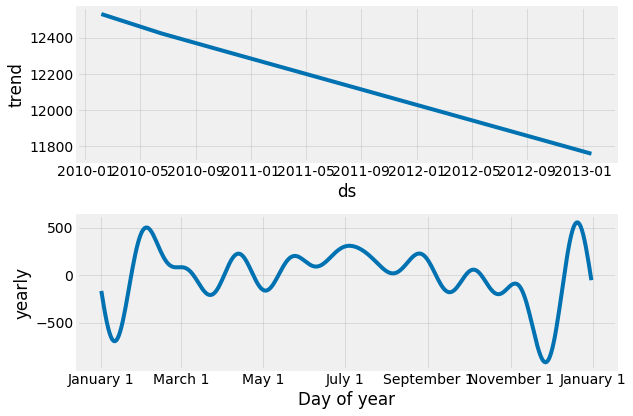

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 81
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6443 2012-12-23  14656.062481 -4593.637505  33554.370776
6444 2012-12-30  14401.952039 -2154.566905  34839.797077
6445 2013-01-06  14509.568519 -5690.152411  33463.164335
6446 2013-01-13  15054.358943 -2877.128472  33897.723620
6447 2013-01-20  15770.383982 -2282.645862  35350.800155
Forcasting


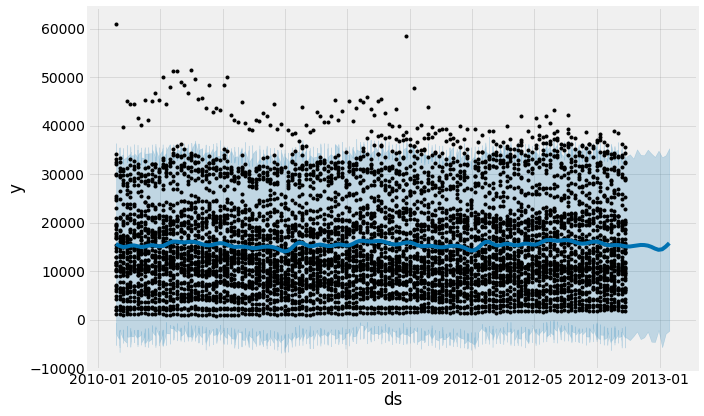

Model Intepretation


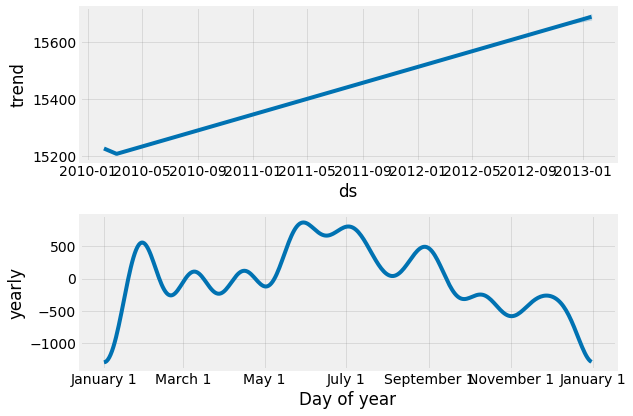

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 82
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
6443 2012-12-23  40359.717629  22338.158428  59313.070545
6444 2012-12-30  31477.784722  13334.327842  49389.344297
6445 2013-01-06  18995.629829   1620.405236  35040.967426
6446 2013-01-13  10998.289789  -7051.385412  29626.820057
6447 2013-01-20  10631.754907  -6633.251887  28758.258581
Forcasting


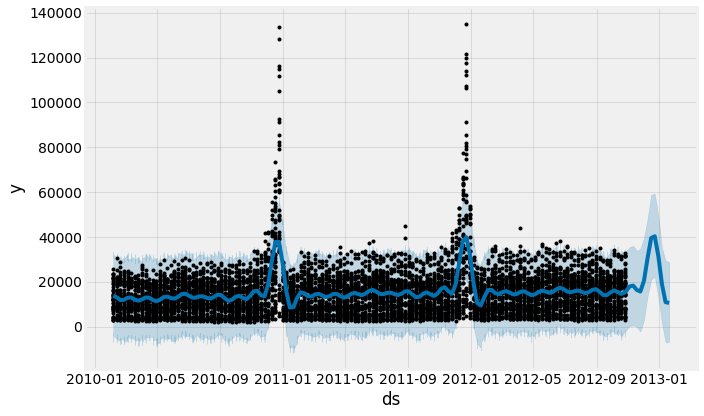

Model Intepretation


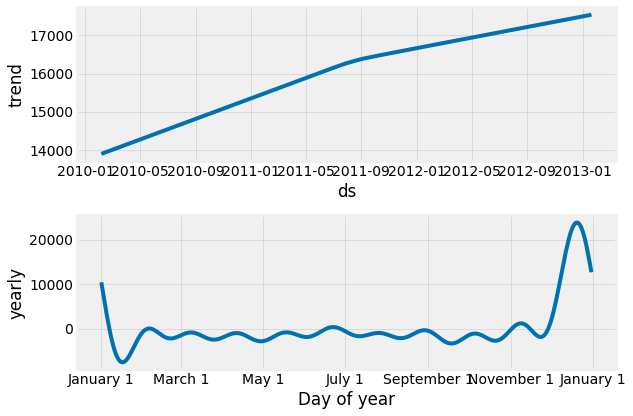

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 83
             ds
5916 2012-12-23
5917 2012-12-30
5918 2013-01-06
5919 2013-01-13
5920 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
5916 2012-12-23  3905.411418 -1364.118143  9280.255494
5917 2012-12-30  3981.352176 -1216.923083  9404.414880
5918 2013-01-06  3793.870170 -1609.723587  9856.170454
5919 2013-01-13  3533.879463 -1940.914109  9187.541173
5920 2013-01-20  3388.092401 -2388.031719  9129.541826
Forcasting


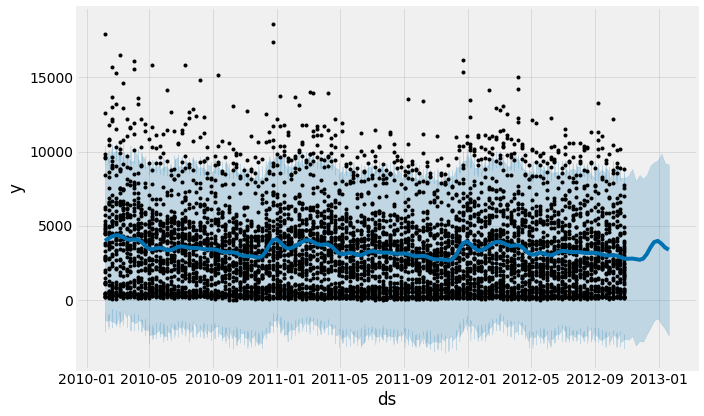

Model Intepretation


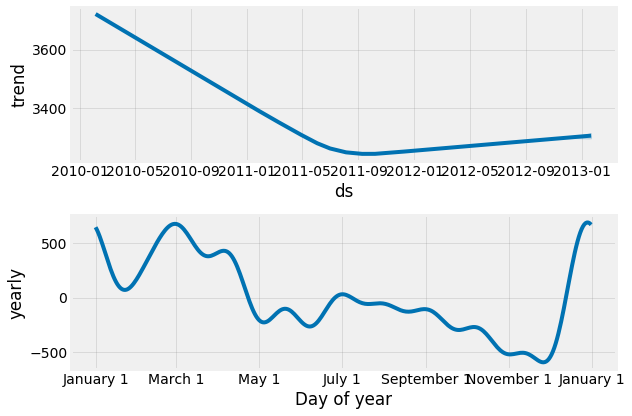

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 85
             ds
6063 2012-12-23
6064 2012-12-30
6065 2013-01-06
6066 2013-01-13
6067 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
6063 2012-12-23  4885.560788  1724.325906  7869.703039
6064 2012-12-30  3341.314518   380.592724  6242.543780
6065 2013-01-06  1764.806527 -1092.757731  4847.393575
6066 2013-01-13  1056.374035 -1854.628321  4312.800916
6067 2013-01-20  1206.762371 -1727.312563  4180.788143
Forcasting


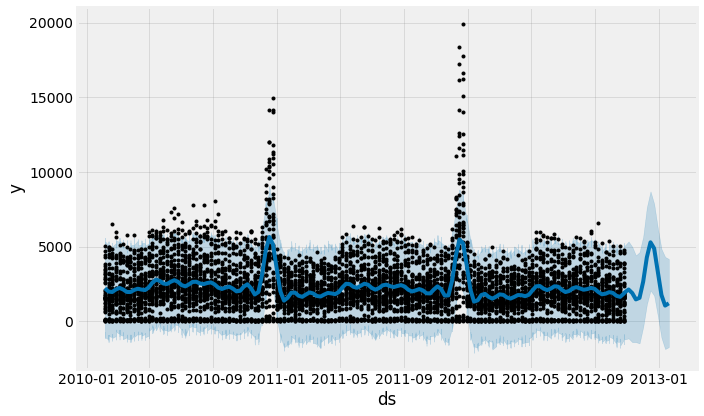

Model Intepretation


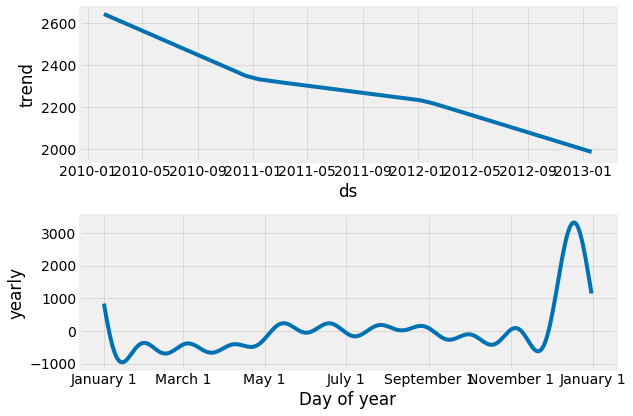

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 87
             ds
6399 2012-12-23
6400 2012-12-30
6401 2013-01-06
6402 2013-01-13
6403 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6399 2012-12-23  18935.618332 -3275.488046  41651.469104
6400 2012-12-30  17677.366630 -3482.976955  40577.091043
6401 2013-01-06  15582.564123 -7946.154732  37991.839123
6402 2013-01-13  14296.196361 -7985.706237  36008.657788
6403 2013-01-20  14737.824025 -5822.079444  37474.094381
Forcasting


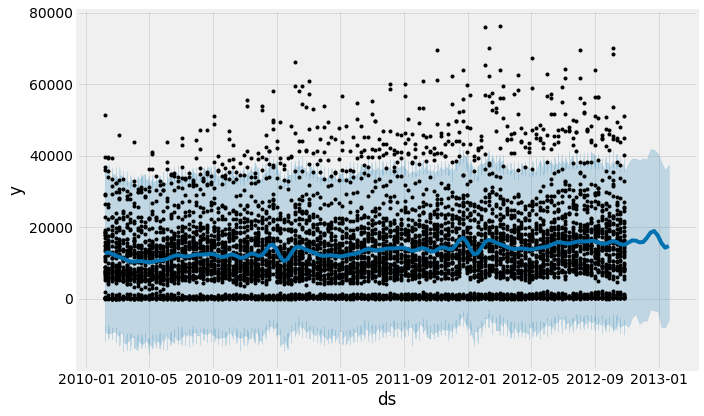

Model Intepretation


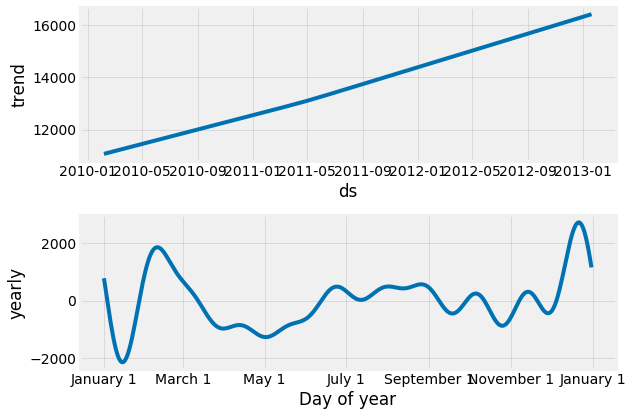

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 90
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower     yhat_upper
6443 2012-12-23  53329.700862 -12639.918863  123504.884366
6444 2012-12-30  51369.524399 -13673.894402  112045.663935
6445 2013-01-06  48350.600829 -14860.895329  110258.391655
6446 2013-01-13  46756.050001 -14567.612531  111489.539037
6447 2013-01-20  47622.812274 -14600.579163  107392.091063
Forcasting


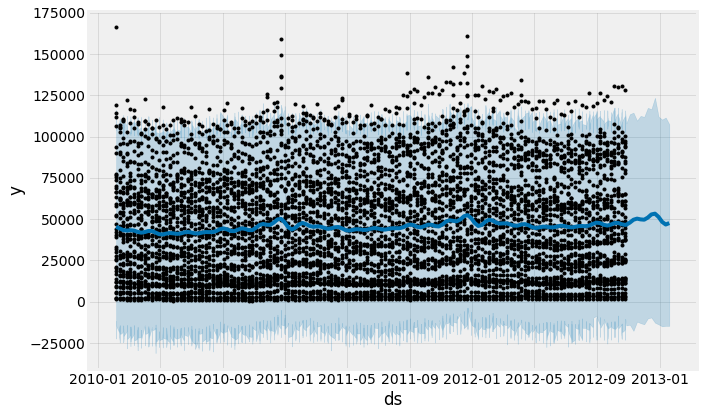

Model Intepretation


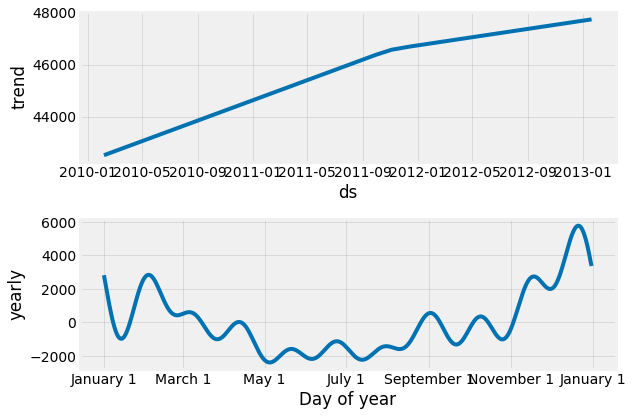

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 91
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
6443 2012-12-23  33381.881686 -16797.634677  86922.006793
6444 2012-12-30  33249.954128 -15878.298270  84712.618990
6445 2013-01-06  33643.593047 -16817.253517  82349.498514
6446 2013-01-13  34802.281461 -10109.464160  82951.037188
6447 2013-01-20  36233.186437 -11902.340263  87732.417575
Forcasting


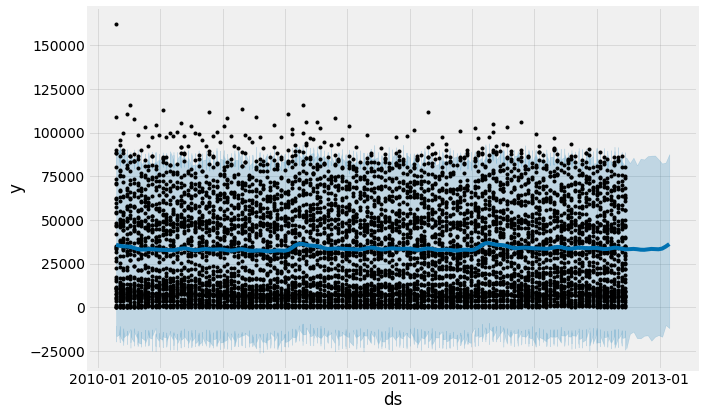

Model Intepretation


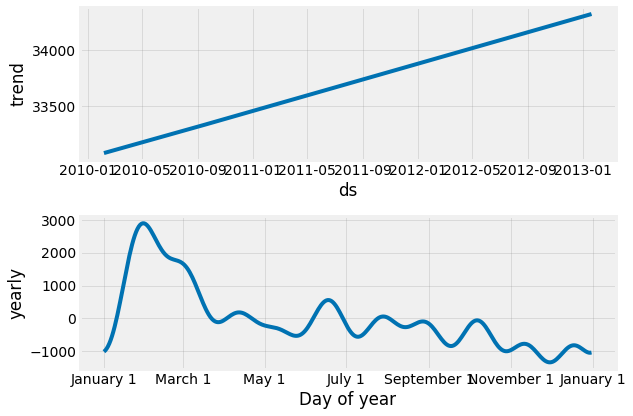

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 92
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower     yhat_upper
6443 2012-12-23  93385.930512    422.112521  191316.143642
6444 2012-12-30  88986.088231   2431.076963  185500.671164
6445 2013-01-06  83646.660008 -14283.318972  181173.593704
6446 2013-01-13  81573.968262 -23336.665413  178962.845959
6447 2013-01-20  83890.122265  -4594.373801  181520.088164
Forcasting


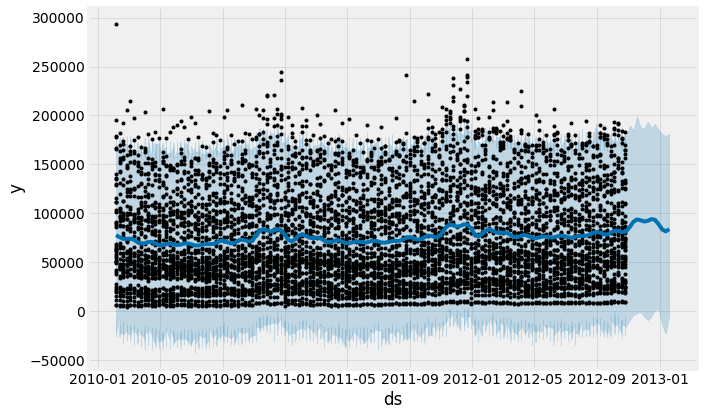

Model Intepretation


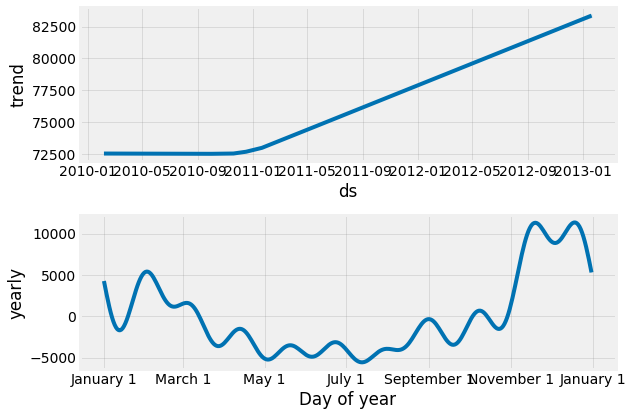

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 93
             ds
5921 2012-12-23
5922 2012-12-30
5923 2013-01-06
5924 2013-01-13
5925 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
5921 2012-12-23  29997.396137 -17699.043270  75743.609830
5922 2012-12-30  29736.751572 -15871.886708  73742.482374
5923 2013-01-06  27960.098225 -18243.188683  72462.397144
5924 2013-01-13  26382.523089 -18002.341659  71149.835363
5925 2013-01-20  26469.345752 -18780.147423  74115.160910
Forcasting


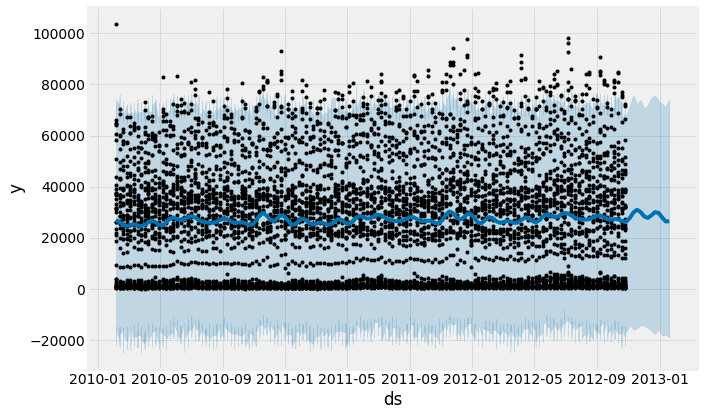

Model Intepretation


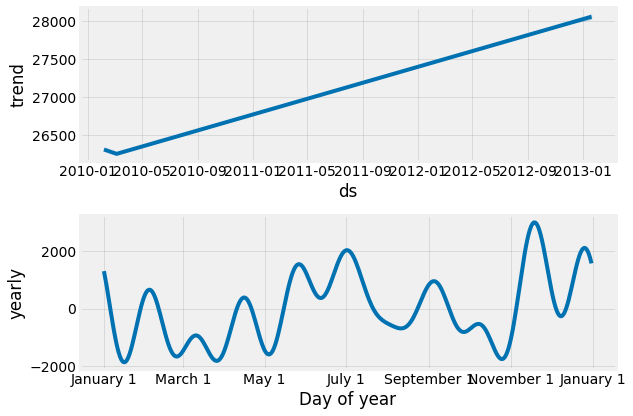

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 94
             ds
5693 2012-12-23
5694 2012-12-30
5695 2013-01-06
5696 2013-01-13
5697 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
5693 2012-12-23  27324.664940 -20045.864457  76015.828491
5694 2012-12-30  27848.421126 -18874.282658  74796.969206
5695 2013-01-06  28172.884680 -21697.334941  72896.958879
5696 2013-01-13  28823.394777 -20308.545753  76013.148174
5697 2013-01-20  29846.994816 -15996.252079  78982.642768
Forcasting


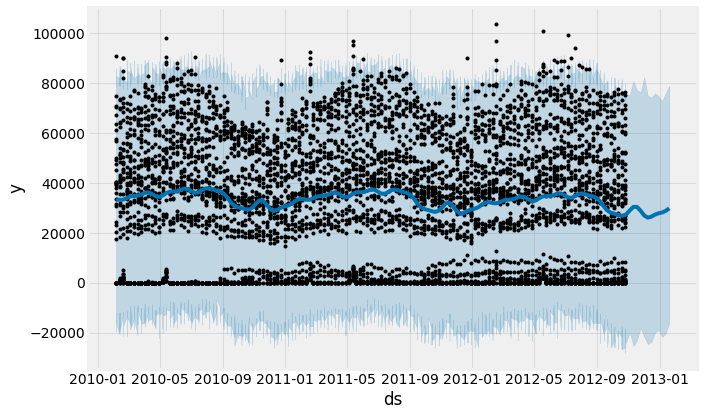

Model Intepretation


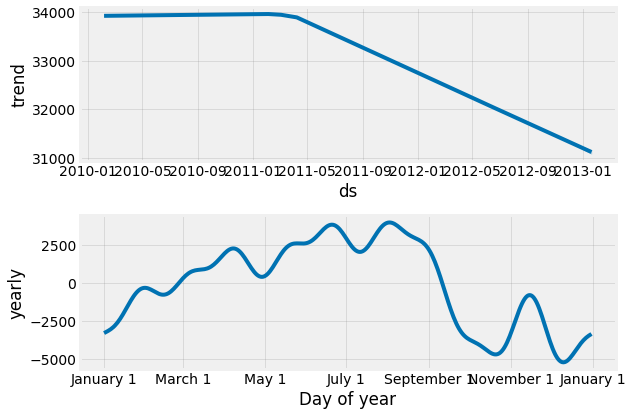

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 95
             ds
6443 2012-12-23
6444 2012-12-30
6445 2013-01-06
6446 2013-01-13
6447 2013-01-20
             ds          yhat    yhat_lower     yhat_upper
6443 2012-12-23  68245.577318  -2367.254795  133436.009645
6444 2012-12-30  66069.977425  -5539.628803  139326.317362
6445 2013-01-06  63327.795971  -9273.817924  133405.312573
6446 2013-01-13  62703.968349 -11047.537690  135318.884086
6447 2013-01-20  64950.571533 -11610.622976  140668.838795
Forcasting


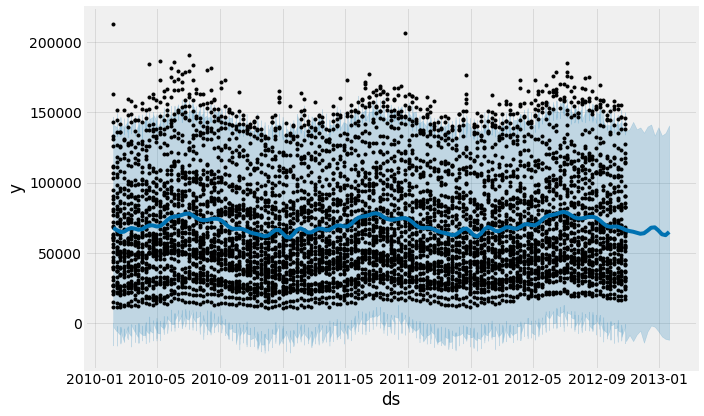

Model Intepretation


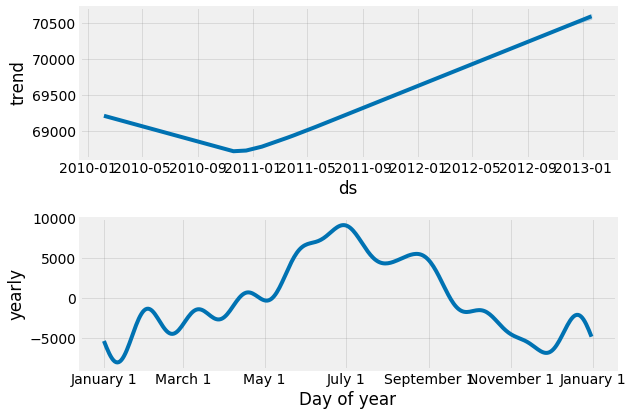

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 96
             ds
4862 2012-12-23
4863 2012-12-30
4864 2013-01-06
4865 2013-01-13
4866 2013-01-20
             ds          yhat    yhat_lower    yhat_upper
4862 2012-12-23  16785.280013  -4739.367657  39519.680884
4863 2012-12-30  16912.674975  -4186.160468  39677.744332
4864 2013-01-06  14768.922773  -6177.507087  35470.110121
4865 2013-01-13  12037.698049 -10852.444943  32866.273692
4866 2013-01-20  11015.171439 -11877.177780  34040.416870
Forcasting


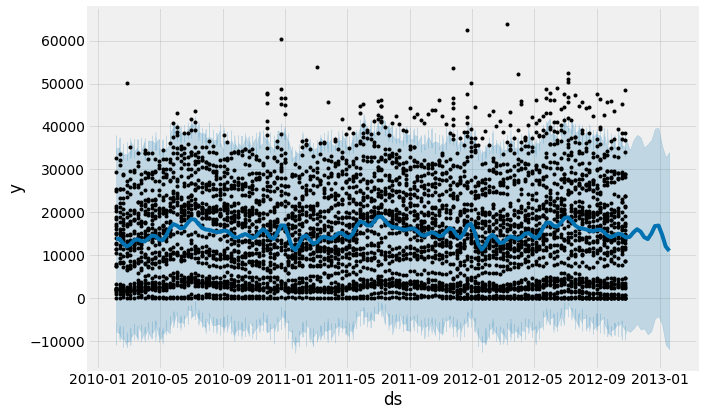

Model Intepretation


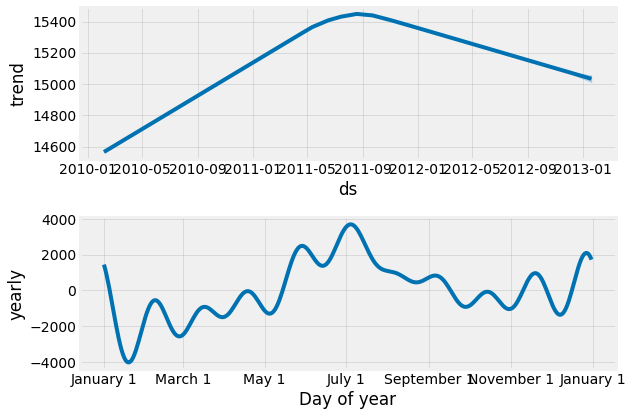

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 97
             ds
6286 2012-12-23
6287 2012-12-30
6288 2013-01-06
6289 2013-01-13
6290 2013-01-20
             ds          yhat   yhat_lower    yhat_upper
6286 2012-12-23  14920.511343 -5843.995697  37350.311035
6287 2012-12-30  14627.959516 -6435.288698  35981.695135
6288 2013-01-06  13991.287400 -5975.554757  35172.761309
6289 2013-01-13  13649.869904 -7402.846434  35055.839103
6290 2013-01-20  13897.777384 -6408.346560  35038.192001
Forcasting


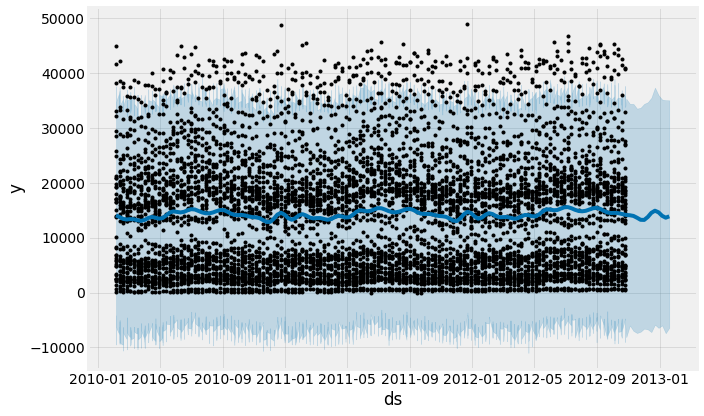

Model Intepretation


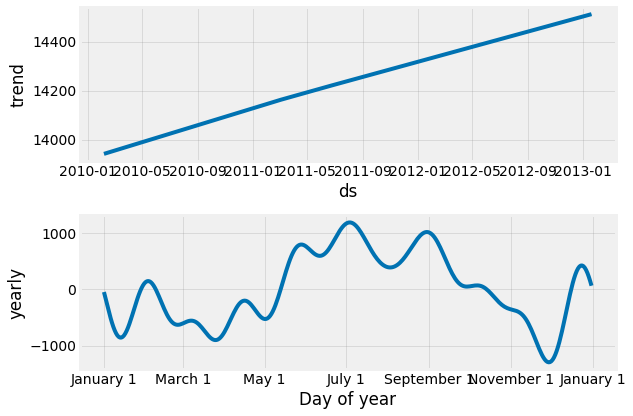

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 98
             ds
5844 2012-12-23
5845 2012-12-30
5846 2013-01-06
5847 2013-01-13
5848 2013-01-20
             ds         yhat   yhat_lower    yhat_upper
5844 2012-12-23  7757.983431 -2769.240310  18040.078835
5845 2012-12-30  6870.674184 -4360.315544  18236.979832
5846 2013-01-06  5644.163443 -5418.762576  16143.759460
5847 2013-01-13  4789.848035 -6269.875895  15522.798159
5848 2013-01-20  4814.307048 -5540.736961  15390.914615
Forcasting


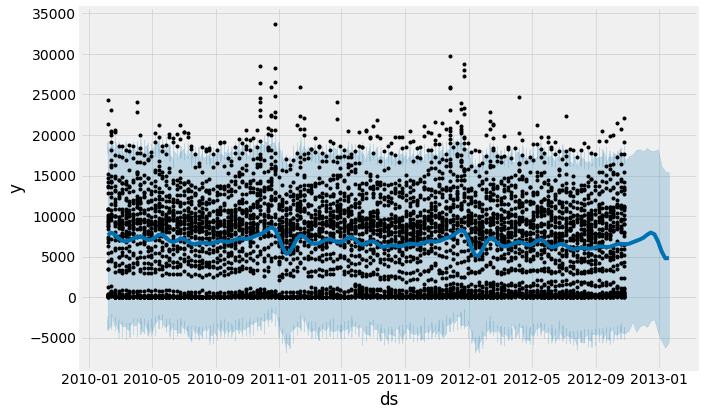

Model Intepretation


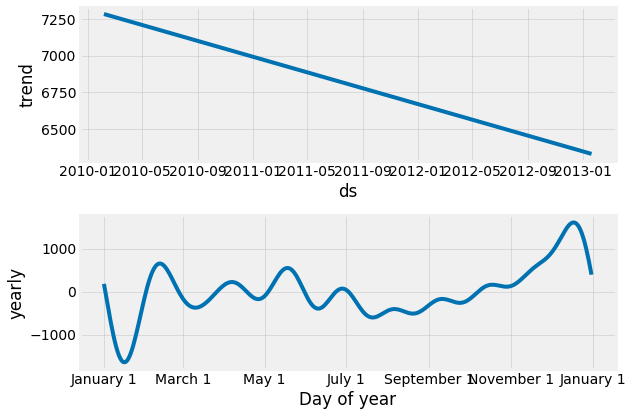

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 99
            ds
870 2012-12-23
871 2012-12-30
872 2013-01-06
873 2013-01-13
874 2013-01-20
            ds         yhat   yhat_lower   yhat_upper
870 2012-12-23  2125.192723   498.992000  3755.547271
871 2012-12-30  1148.137246  -448.429029  2652.690062
872 2013-01-06  -511.338369 -2078.946769  1015.280038
873 2013-01-13 -1793.959717 -3395.414788  -185.598621
874 2013-01-20 -1770.523419 -3410.272215  -232.732268
Forcasting


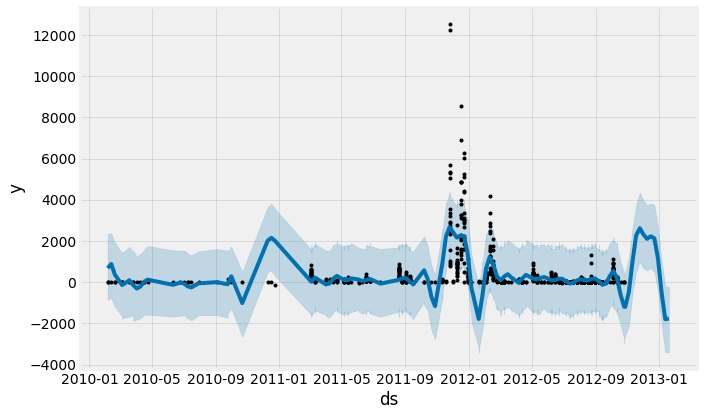

Model Intepretation


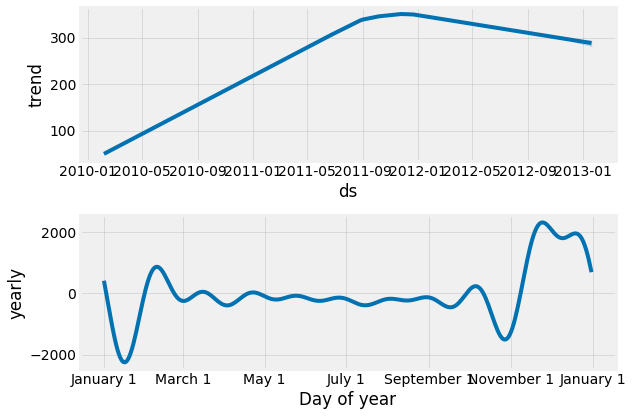

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 11.0.


Department: 39
           ds
24 2012-12-23
25 2012-12-30
26 2013-01-06
27 2013-01-13
28 2013-01-20
           ds       yhat  yhat_lower  yhat_upper
24 2012-12-23  10.006471    5.711906   14.296218
25 2012-12-30   6.791320    2.180492   11.392054
26 2013-01-06  13.301904    8.688464   17.883426
27 2013-01-13  25.811640   21.419944   30.185765
28 2013-01-20  32.072606   27.740280   36.571361
Forcasting


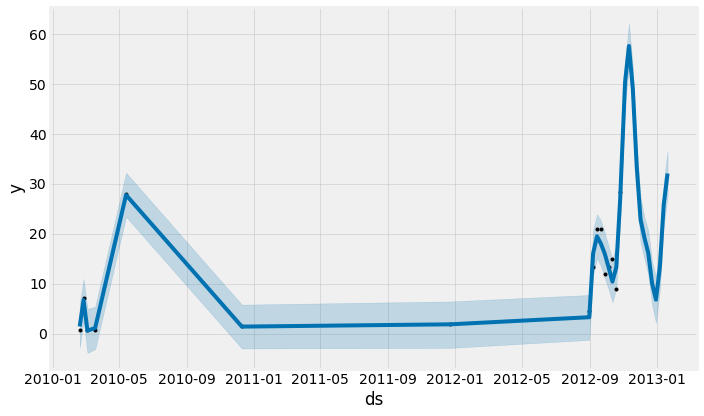

Model Intepretation


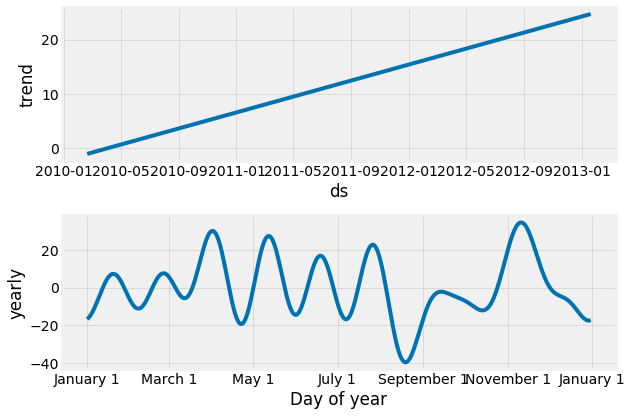

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 50
             ds
1570 2012-12-23
1571 2012-12-30
1572 2013-01-06
1573 2013-01-13
1574 2013-01-20
             ds         yhat   yhat_lower   yhat_upper
1570 2012-12-23  2242.247731 -1070.320008  5904.706528
1571 2012-12-30  2360.216132 -1124.054803  5550.902588
1572 2013-01-06  2559.278633  -685.896003  6075.412063
1573 2013-01-13  2714.850414  -582.299911  5930.969378
1574 2013-01-20  2730.730540  -763.054935  6129.541001
Forcasting


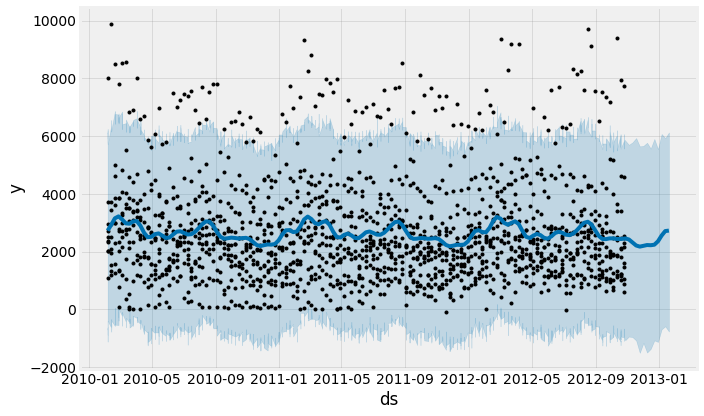

Model Intepretation


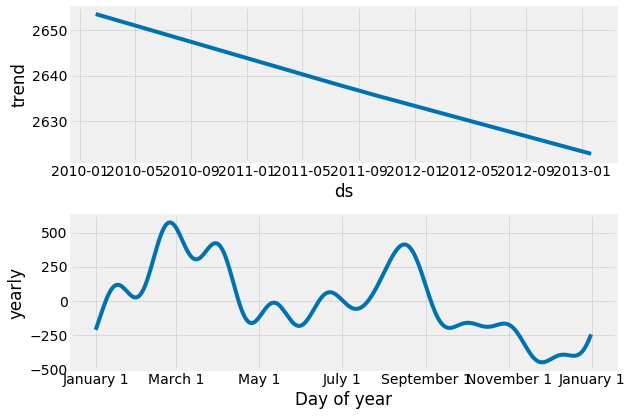

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 8.0.


Department: 43
           ds
20 2012-07-08
21 2012-07-15
22 2012-07-22
23 2012-07-29
24 2012-08-05
           ds       yhat  yhat_lower  yhat_upper
20 2012-07-08  39.370227   39.228594   39.524977
21 2012-07-15  22.092354   21.921865   22.282036
22 2012-07-22   4.007331    3.809143    4.232946
23 2012-07-29   0.794203    0.574458    1.052263
24 2012-08-05   9.462541    9.208356    9.752813
Forcasting


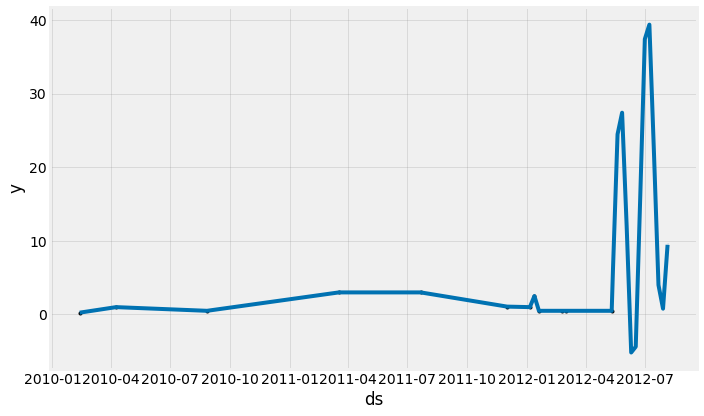

Model Intepretation


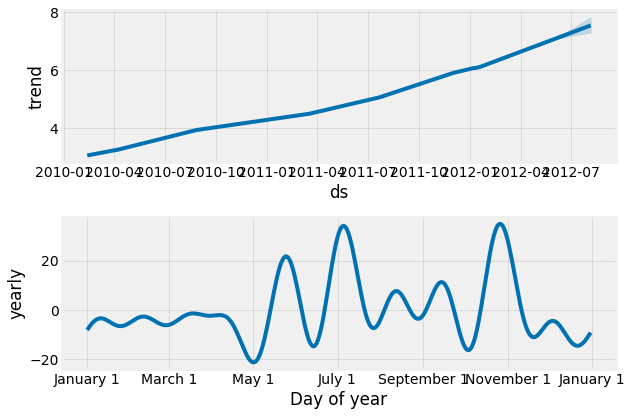

/usr/local/lib/python3.6/dist-packages/fbprophet/forecaster.py:880: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  min_dt = dt.iloc[dt.nonzero()[0]].min()
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Department: 65
            ds
151 2012-12-23
152 2012-12-30
153 2013-01-06
154 2013-01-13
155 2013-01-20
            ds          yhat    yhat_lower    yhat_upper
151 2012-12-23  47916.218896  40868.814794  54443.790562
152 2012-12-30  47249.104822  40622.614885  53866.064491
153 2013-01-06  47638.224010  40715.944405  53502.809046
154 2013-01-13  49454.884227  42828.794396  56393.964156
155 2013-01-20  51248.352054  44318.425391  58057.486131
Forcasting


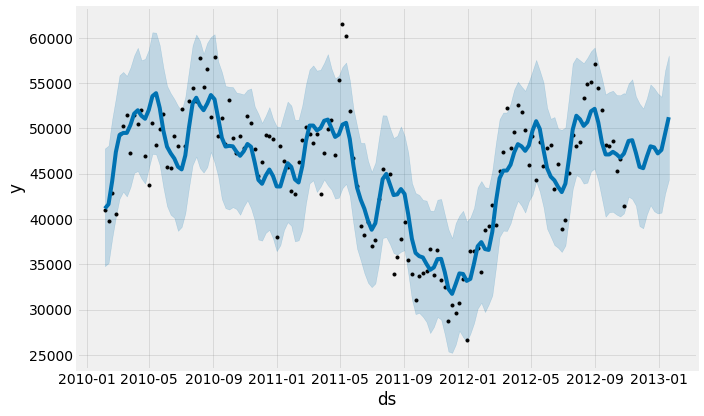

Model Intepretation


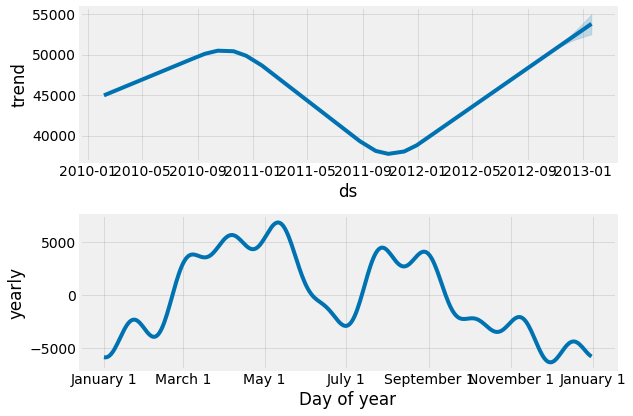

In [26]:
## run model for all deparment

for deptment in dept:
  print('='*50)
  print('Department: {}'.format(deptment))
  print('='*50)
  run_prophet(df[df['Dept'] == deptment])